# **UK Road Accidents Detailed Analysis** 

## **Index:**
1. [INTRODUCTION](#Intro)
    * [Problem Definition](#PD)
    * [Data](#Data)
2. [EXPLORATORY DATA ANALYSIS](#EDA)
    1. [ALL ACCIDENTS](#All)
        * [TIME ANALYSIS - COPMLETE DATA](#tcomp)
        * [GOOGLE API & CLUSTERING -COMPLETE DATA](#Bonus1)
    2. [MAJOR INCIDENTS](#Major)
        * [TIME ANALYSIS - MAJOR INCIDENTS](#tmajor)
        * [TIME & LOCATION ANALYSIS](#tloc)
        * [GOOGLE API & CLUSTERING -MAJOR INCIDENTS](#Bonus2) 
        * [SEASONAL EFFECT](#Season)
        * [EFFECTS OF OTHER CONDITIONS](#other)
            * [WEATHER CONDITIONS](#weather)
            * [ROAD SURFACE CONDITIONS](#rs)
            * [LIGHT CONDITIONS](#light)
            * [CARRIAGEWAY HAZARDS](#cw)
            * [ROAD TYPE](#rt)
            * [ROAD CLASS (BOTH)](#rc)
            * [JUNCTION DETAIL](#jd)
            * [JUNCTION CONTROL](#jc)
            * [PEDESTRIAN CROSSING HUMAN CONTROL](#pchc)
            * [PEDESTRIAN CROSSING PHYSICAL FACILITIES](#pcpf)
            * [SPECIAL CONDITIONS AT SITE](#special)
3. [ANSWERS](#Answers)
    * [Question 1](#Q1)
    * [Question 2](#Q2)
    * [Question 3](#Q3)
    * [Question 4](#Q4)
4. [CONCLUSION](#Conc)

# 1) INTRODUCTION:<a id="Intro"></a>

## **PROBLEM DEFINITION:**<a id="PD"></a>

Identifying the characteristics of the **"major incidents"** to lower the number of deaths by answering following questions:

 1. What time of day and day of the week do most major incidents happen?
 2. Are there any patterns in the time of day/ day of the week when major incidents occur?
 3. What characteristics stand out in major incidents compared with other accidents?
 4. On what areas would you recommend the planning team focus their brainstorming efforts to reduce major incidents?

## **DATA:**<a id="Data"></a>

This report is based on 2 separate datasets, where; first one have the data of all accidents(df) and second one (lu) has definitive information about first dataset. We originally have 91199 different accidents and 27 features giving different information related with each accident.   

We will be focusing on some particular type of accidents which we call **Major Incident** and try to answer above listed 4 questions. 

A **Major Incident** is defined as a **"Fatal"** accident with **"3+"** casualties. ⚠️

We have;
* 3 irrelevant features which do not contain any useful information for our analysis; "accident_index", "accident_reference" and "accident_year",
* 5 features giving information about the location of the accidents; "latitude", "longitude", "first_road_number", "second_road_number", "urban_rural", 
* 3 features giving information about the date and time of the accident; "date","day_of_week", "time".
* 3 features describing the severity of the accident; "accident_severity", "number_of_vehicles", "number_of_casualties"
* 13 more features describing various conditions of the accident site like; "junctions, weather, light conditions and more.

As listed below ⬇️

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.image as mpimg
from matplotlib import rcParams
import seaborn as sns
from sklearn.cluster import KMeans
from bokeh.io import output_file, output_notebook, show, export_png
from bokeh.models import (GMapPlot, GMapOptions, ColumnDataSource,
                          Circle, LogColorMapper, BasicTicker, ColorBar,CategoricalColorMapper,
                          Range1d, PanTool, WheelZoomTool, BoxSelectTool)
from bokeh.models.mappers import ColorMapper, LinearColorMapper
from bokeh.palettes import Plasma4, Inferno4, Magma4,RdBu4
from bokeh.layouts import layout

In [2]:
def code2label(feat):
    
    """ Returns a dictionary; with the 'codes' of input feature of major dataset as 'keys', 
    and corresponding 'labels' as values. To be later used on mapping """

    dic = {}
    for i, row in lu[lu["field name"]==feat][["code/format", "label"]].iterrows():
        dic[int(row["code/format"])]=row["label"]
    return dic

In [3]:
def divide_rows(list_of_texts):
    
    """ Returns a formatted label list to be used as tick labels in long strings """
    
    label_list=[]
    for text in list_of_texts:
        word_list =text.get_text().split(" ")
        length = len(word_list)
        if 3<length<=7:
            word_list = word_list[:3]+ ["\n"] + word_list[3:]
            label_list.append(" ".join(word_list))
        elif 7<length:
            word_list = word_list[:3]+ ["\n"] + word_list[3:7] + ["\n"] + word_list[7:]
            label_list.append(" ".join(word_list))
        else:
            label_list.append(" ".join(word_list))
    return label_list 

In [4]:
def plot_center (center):
    
    """ Plots accident locations in input center on Google Map """
    
    map_options = GMapOptions(lat=centers[center][0], lng=centers[center][1],
                          map_type="roadmap",zoom=8)
    plot = GMapPlot(
        x_range=Range1d(), y_range=Range1d(), map_options=map_options, 
        width_policy="max", height_policy="max", visible = True)

    plot.title.text = "Group_{}".format(center)
    plot.api_key = "Paste your own Google API"
    
    """
    You can get your own Google API by following the instructions from the link
    
    #https://developers.google.com/maps/documentation/javascript/get-api-key"""
    


    source = ColumnDataSource(
        data=dict(
            lat=df_label[df_label["clusters"]==center]["latitude"].tolist(),
            lon=df_label[df_label["clusters"]==center]["longitude"].tolist(),
            size = df_label[df_label["clusters"]==center]["accident_severity"].map(
                {"Fatal":8, "Serious":3, "Slight":1}
            ).tolist(),
            color = df_label[df_label["clusters"]==center]["accident_severity"].map(
                {"Fatal":"red", "Serious":"blue", "Slight":"yellow"}
            ).tolist()
            )
        )
    color_mapper = LinearColorMapper(palette=RdBu4)
    circle = Circle(x="lon", y="lat", size= "size", fill_color="color",
                fill_alpha=0.8, line_color=None)
    plot.add_glyph(source, circle)
    return plot

In [5]:
def plot_danger_freq (feat, normal, danger, freq, loc_x,loc_y, title_id1, title_id2):
    """Plots two figures; 
    First one is the comparison of the added danger('danger') of the conditions in
    input feature('feat') with the 'normal' condition of input feature. 
    Second figure displays the major accident counts in each condition of input feature.
    loc_x and loc_y are the coordinates of the text.
    title_id1 and 2 are the number id's of each plot.
    """
    df_gb = df_major.groupby(feat)[[danger, freq]].mean()
    #df_gb = df_gb.drop(droplist) 
    threshold = df_gb.loc[normal][danger]
    y1 = df_gb[danger]
    y2 = df_gb[freq]
    x = df_gb.index
    at = np.maximum(y1 - threshold, 0)
    bt = np.minimum(y1, threshold)
    fig, ax = plt.subplots(2,1,figsize=(15,10))
    ax[0].bar(x , at, color="r", bottom=bt)
    ax[0].bar(x , bt, color="g")
    ax[0].plot([-0.5, len(x)-0.5], [threshold, threshold], "k--")
    ax[0].text(loc_x,loc_y, s="Extra Danger Zone", fontsize=25, color="r", style="italic")
    ax[0].set_title("{}: Added danger by {}".format(title_id1, feat), loc="center", size="xx-large")
    ax[1].bar(x , y2)
    ax[1].set_title("{}: Count of major accidents ".format(title_id2), loc="center", size="xx-large")
    label_list=[]
    labels = df_gb.index.tolist()
    for x in labels:    
        x = x.split(" ")
        length = len(x)
        if 4<length<=7:
            x = x[:4]+ ["\n"] + x[4:]
            label_list.append(" ".join(x))
        elif 7<length:
            x = x[:4]+ ["\n"] + x[4:8] + ["\n"] + x[8:]
            label_list.append(" ".join(x))
        else:
            label_list.append(" ".join(x))
    for i in range(2):
        ax[i].set_xticks(ax[i].get_xticks())
        ax[i].set_xticklabels(label_list, fontsize=15)
        ax[i].tick_params(axis='x', rotation=45)
    plt.tight_layout()
    return ax    

In [6]:
def major_perc(feature):
    
    """ Returns a dictionary with conditions of input feature as keys and
    percentage of major incidents among all accidents related with given condition, as values of the dictionary"""
    
    value_range = df_major[feature].unique().tolist()
    major_dict = {}
    for val in value_range:
        total_count = df_label[df_label[feature]==val].shape[0]
        major_count = df_major[df_major[feature]==val].shape[0]
        major_rate = (major_count/total_count)*100 
        major_dict[val]=round(major_rate,2)
        
    return major_dict

In [7]:
def major_count(feature):
    
    """ Returns a dictionary with conditions of input feature as keys and
    count of major incidents related with given condition, as values of the dictionary"""
    
    value_range = df_major[feature].unique().tolist()
    major_dict = {}
    for val in value_range:
        major_count = df_major[df_major[feature]==val].shape[0]
        major_dict[val] = major_count
        
    return major_dict

In [8]:
df = pd.read_csv(r"./data/accident-data.csv")
lu = pd.read_csv(r"./data/road-safety-lookups.csv")

In [9]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   accident_index                           91199 non-null  object 
 1   accident_year                            91199 non-null  int64  
 2   accident_reference                       91199 non-null  object 
 3   longitude                                91185 non-null  float64
 4   latitude                                 91185 non-null  float64
 5   accident_severity                        91199 non-null  int64  
 6   number_of_vehicles                       91199 non-null  int64  
 7   number_of_casualties                     91199 non-null  int64  
 8   date                                     91199 non-null  object 
 9   day_of_week                              91199 non-null  int64  
 10  time                                     91199

In [11]:
df.head()

,accident_index,accident_year,accident_reference,longitude,latitude,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area
0,2020010219808,2020,10219808,-0.254001,51.462262,3,1,1,04/02/2020,3,09:00,6,0,6,20,0,-1,6,0,9,9,1,9,9,0,0,1
1,2020010220496,2020,10220496,-0.139253,51.470327,3,1,2,27/04/2020,2,13:55,3,3036,6,20,9,2,6,0,0,4,1,1,1,0,0,1
2,2020010228005,2020,10228005,-0.178719,51.529614,3,1,1,01/01/2020,4,01:25,5,0,6,30,3,1,6,0,0,0,4,1,2,0,0,1
3,2020010228006,2020,10228006,-0.001683,51.541210,2,1,1,01/01/2020,4,01:50,3,11,6,30,0,-1,6,0,0,4,4,1,1,0,0,1
4,2020010228011,2020,10228011,-0.137592,51.515704,3,1,2,01/01/2020,4,02:25,3,40,6,30,3,4,5,0,0,0,4,1,1,0,0,1


In [12]:
ind_long = df[df["longitude"].isnull()].index
ind_urb = df[df["urban_or_rural_area"]==3].index
ind_long == ind_urb

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True])

In [13]:
lu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129 entries, 0 to 128
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   table        129 non-null    object
 1   field name   129 non-null    object
 2   code/format  121 non-null    object
 3   label        119 non-null    object
 4   note         10 non-null     object
dtypes: object(5)
memory usage: 5.2+ KB


In [14]:
lu.head(10)

,table,field name,code/format,label,note
0,Accident,accident_index,NaN,NaN,unique value for each accident. The accident_i...
1,Accident,accident_year,NaN,NaN,NaN
2,Accident,accident_reference,NaN,NaN,In year id used by the police to reference a c...
3,Accident,longitude,NaN,NaN,Null if not known
4,Accident,Latitude,NaN,NaN,Null if not known
5,Accident,accident_severity,1,Fatal,NaN
6,Accident,accident_severity,2,Serious,NaN
7,Accident,accident_severity,3,Slight,NaN
8,Accident,number_of_vehicles,NaN,NaN,NaN
9,Accident,number_of_casualties,NaN,NaN,NaN


As discussed above, we will; 
* drop some of these feature since they do not provide necessary information for our analysis. 
* and extract some new features using or combining existing ones for our best use.

In [15]:
#drop rows with no location
df.dropna(inplace=True)
df.reset_index(inplace=True, drop=True)

In [16]:
# drop irrelevant columns
df.drop(["accident_index","accident_year","accident_reference"], axis=1, inplace=True)

In [17]:
label_features = lu[lu["label"].notnull()]["field name"].unique().tolist()
bad_labels = ["first_road_number", "second_road_number", "speed_limit"]
map_features = [feat for feat in label_features if feat not in bad_labels]
df_label = df.copy()
for feat in map_features:
    dic = code2label(feat)
    df_label[feat] = df[feat].map(dic)

In [18]:
# differentiate the "Major" incidents ("# of casualties >2" & "Fatal")
ind = df_label.loc[(df_label["number_of_casualties"]>=3)&(df_label["accident_severity"]=="Fatal")].index
df_label["Is_Major"] = False
df_label.at[ind, "Is_Major"] = True

# 2) EXPLORATORY DATA ANALYSIS:<a id="EDA"></a>

## **2-A) ALL ACCIDENTS:**<a id="All"></a>

Although we will focus to a particular type of accidents, we better start by observing all accidents in order to build a perspective about the general pattern of the data.

First we will try to catch a pattern, over timing of accidents by visualizing them. 

In [19]:
df_label["date"] = pd.to_datetime(df_label["date"],infer_datetime_format=True)
df_label["month"] = df_label["date"].dt.month

In [20]:
df_label["time"] = pd.to_datetime(df_label["time"], format="%H:%M")
df_label['hour'] = df_label['time'].dt.round('H').dt.hour

In [21]:
df_label["season"] = df_label["month"].map({12:"winter", 1:"winter", 2:"winter", 
                                            3:"spring", 4:"spring", 5:"spring", 
                                            6:"summer", 7:"summer", 8:"summer", 
                                            9:"fall", 10:"fall", 11:"fall"})

### **2-A-1) TIME ANALYSIS - COMPLETE DATA**<a id="tcomp"></a>

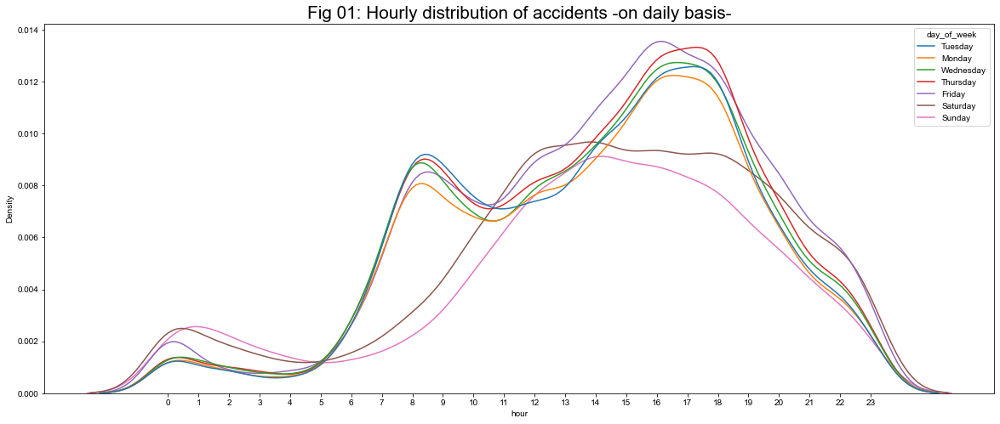

In [22]:
fig, ax = plt.subplots(figsize=(20,8))
sns.kdeplot(x="hour", hue="day_of_week", data=df_label, ax=ax)
sns.set_theme(style="darkgrid")

ax.set_title("Fig 01: Hourly distribution of accidents -on daily basis-", loc="center", size="xx-large")
ax.set_xticklabels(np.arange(24))
ax.set_xticks(np.arange(24))

Fig 01, plots the hourly distribution of accident counts in each day.
It is visible in "Fig 01" that there is a pattern between weekends and weekdays. 

So let's make this more visible by decomposing **"Weekends and Weekdays"**

In [23]:
df_label["Weekend"] = df_label["day_of_week"].apply(lambda x: "weekend" if x in ['Saturday', 'Sunday'] else "weekday")

Text(5, 0.06, 'To Work')

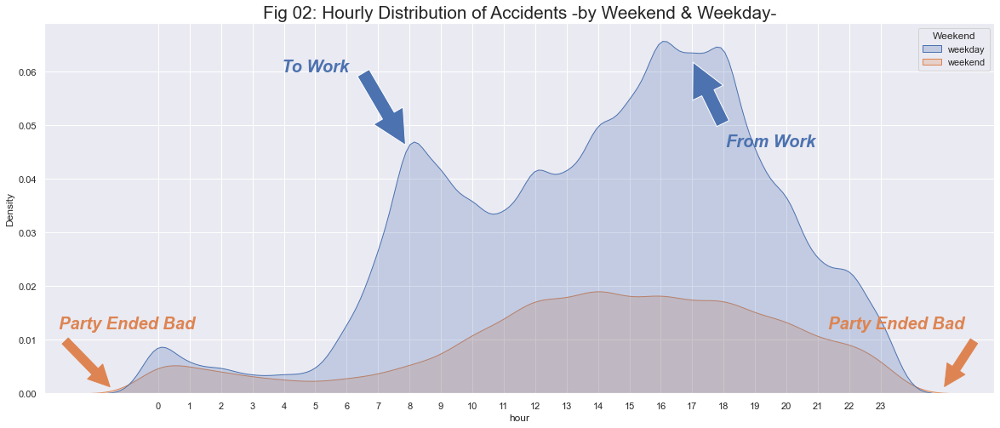

In [24]:
fig, ax = plt.subplots(figsize=(20,8))

sns.kdeplot(x="hour", hue="Weekend", data=df_label, fill=True, ax=ax)
sns.set_theme(style="darkgrid")

arrow1 = mpatches.FancyArrowPatch((6.5, 0.06), (7.9, 0.046), mutation_scale=80)
arrow2 = mpatches.FancyArrowPatch((18, 0.05), (17, 0.062), mutation_scale=80)
arrow3 = mpatches.FancyArrowPatch((-3, 0.01), (-1.5, 0.001), mutation_scale=50, color="C1")
arrow4 = mpatches.FancyArrowPatch((26, 0.01), (25, 0.001), mutation_scale=50, color="C1")

ax.set_xticklabels(np.arange(24))
ax.set_xticks(np.arange(24))
ax.set_title("Fig 02: Hourly Distribution of Accidents -by Weekend & Weekday-", loc="center", size="xx-large")

ax.add_patch(arrow1)
ax.add_patch(arrow2)
ax.add_patch(arrow3)
ax.add_patch(arrow4)

ax.text(x=-1, y=0.012, ha='center', s='Party Ended Bad', fontsize=20, color="C1", style='oblique', weight='demi')
ax.text(x=23.5, y=0.012, ha='center', s='Party Ended Bad', fontsize=20, color="C1", style='oblique', weight='demi')
ax.text(x=19.5, y=0.046, ha='center', s='From Work', fontsize=20, color="C0", style='oblique', weight='demi')
ax.text(x=5, y=0.06, ha='center', s='To Work', fontsize=20, color="C0", style='oblique', weight='demi')

Now the patterns are much more clear in "Fig 02". There are obvious peaks around **08:00** in the morning and between **"16:00 -18:00"** on weekdays. Those time frames seem to be the **morning** and **evening work traffic** where you can not observe those peaks on weekends. 

But weekends seem to have its own pattern which is hard to observe from this plot. 

Time frame between **"23:00 - 00:00"** seems to witness more accidents on weekends compared to weekdays. 

Let's plot another graph to observe those peaks too. 

Text(21, 0.8, 'Party Ended Bad')

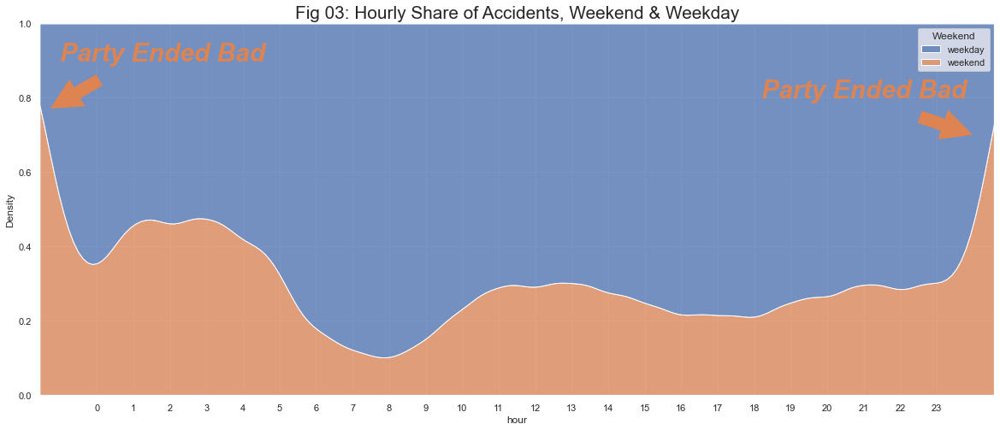

In [25]:
fig, ax = plt.subplots(figsize=(20,8))

sns.kdeplot(x="hour", hue="Weekend", data=df_label, multiple="fill", ax=ax)
sns.set_theme(style="darkgrid")

arrow1 = mpatches.FancyArrowPatch((0.1, 0.85), (-1.3, 0.77), mutation_scale=70, color="C1")
arrow2 = mpatches.FancyArrowPatch((22.5, 0.75), (24, 0.7), mutation_scale=70, color="C1")

ax.set_xticklabels(np.arange(24))
ax.set_xticks(np.arange(24))
ax.set_title("Fig 03: Hourly Share of Accidents, Weekend & Weekday", loc="center", size="xx-large")

ax.add_patch(arrow1)
ax.add_patch(arrow2)

ax.text(x=1.8, y=0.9, ha='center', s='Party Ended Bad', fontsize=30, color="C1", style='oblique', weight='demi')
ax.text(x=21, y=0.8, ha='center', s='Party Ended Bad', fontsize=30, color="C1", style='oblique', weight='demi')

Now it is more visible. Almost %80 of the accidents that took place between 00:00 - 23:00 are on weekends. 

Those seem to be cases where party ended bad 
#### 🥳🚙💥🤕

Let' see how bad?


Text(0.5, 1.0, 'Fig 04: Accident Severity by hour')

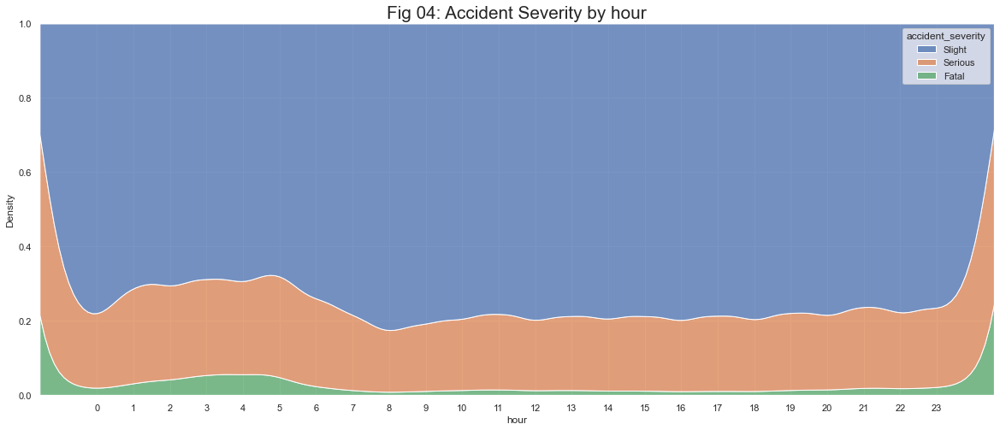

In [26]:
fig, ax = plt.subplots(figsize=(20,8))

sns.kdeplot(x="hour", hue="accident_severity", data=df_label, multiple="fill")
sns.set_theme(style="darkgrid")

ax.set_xticklabels(np.arange(24))
ax.set_xticks(np.arange(24))
ax.set_title("Fig 04: Accident Severity by hour", loc="center", size="xx-large")


We can see from "Fig 04" that it is pretty bad...

Majority of the accidents that happened in **midnight** are; **Serious** and **Fatal**, oppositely majority of the **day time** accidents are **Slight**.

### **2-A-2) GOOGLE API & CLUSTERING**<a id="Bonus1"></a>

When I see coordinates on a dataset, I can not stop myself locating those on a map. I find it very interesting to observe the latitude and longitudes on the map. 

I also am unable to finish any report without a proper ML algorithm 🤷🏻‍♂️. So I used KNN to cluster our locations, plot an elbow curve and find out that it makes sense to group our locations into 4 clusters.

Then I plotted those locations on a map. Unfortunately I couldn't manage to display Bokeh library with Google API on this workspace, so I plotted some maps in my local computer environment and display the results here. 

*PS: You can find function (**plot_center**) that i defined to plot the cluster centers on a Google Map above wtih other functions. Although I did not use it in this notebook, I prefer to keep it for your reference. If you want to try Bokeh library yourself, you may find it useful.* 

In [27]:
X=df_label[['latitude','longitude']]
X.shape

(91185, 2)

In [28]:
clusters = np.arange(1,20)
inertias = []
for n in clusters:
    km = KMeans(n_clusters=n)
    km.fit_transform(X)
    inertias.append(km.inertia_)

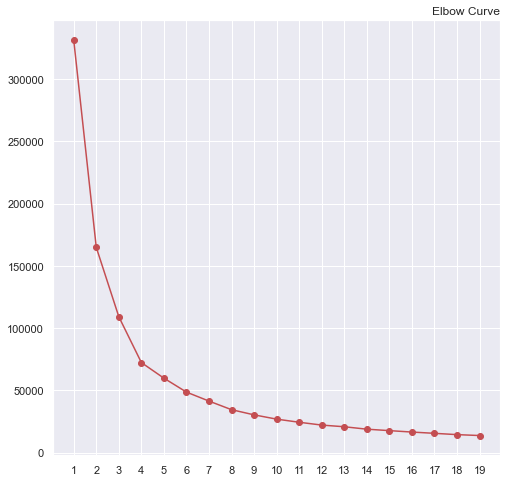

In [29]:
fig, ax = plt.subplots(figsize=(8,8))
ax.plot(clusters, inertias,'-ro')
ax.set_title('Elbow Curve', loc='right')
ax.set_xticklabels(np.arange(1,20))
ax.set_xticks(np.arange(1,20))

I decided to chose 4 number of clusters referring to the above plotted "Elbow Curve". 

In [30]:
model = KMeans(n_clusters=4)
model.fit(X)
df_label.loc[:,["clusters"]] = model.labels_
centers = model.cluster_centers_ 

Text(0.5, 1.0, 'Map 01-2: UK Population Density')

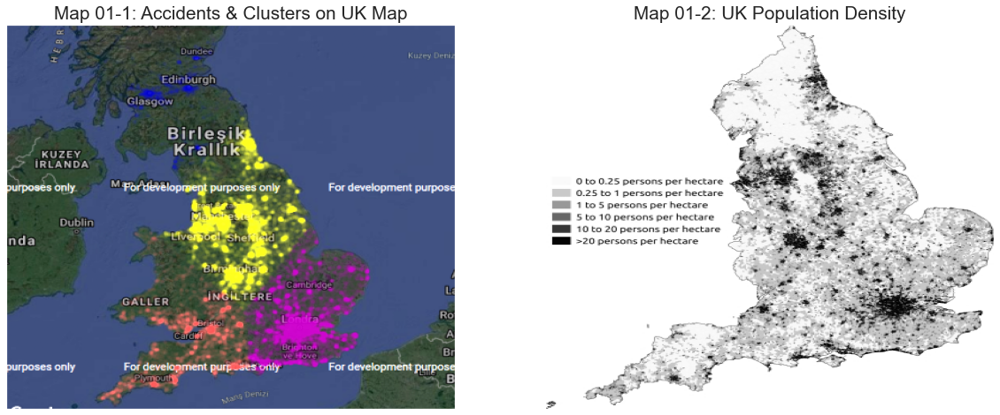

In [31]:
rcParams['figure.figsize'] = 20 ,8

Acc = mpimg.imread(r"./data/England_4_400.png")
Den = mpimg.imread(r"./data/pop_eng_376w.jpg")

fig, ax = plt.subplots(1,2)
for i in range(2):
    ax[i].tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    ax[i].grid(False)


ax[0].imshow(Acc, aspect="auto")
ax[0].set_title("Map 01-1: Accidents & Clusters on UK Map", loc="center", size="xx-large")
ax[1].imshow(Den, aspect="auto")
ax[1].set_title("Map 01-2: UK Population Density", loc="center", size="xx-large")


On the left hand side you can see all of the accidents in our dataset plotted on UK map. After plotting those locations I noticed that accidents are mainly concentrated in high population areas. To confirm this inference, I plotted the UK Population Density graph from Wikipedia (Map 01-2). Can you see the resemblance?

This tells us that the majority of the accidents are in the locations where the population is high. Which makes complete sense. But before going deep in **major incidents**, first I want to plot each cluster and try to catch a more specific pattern.

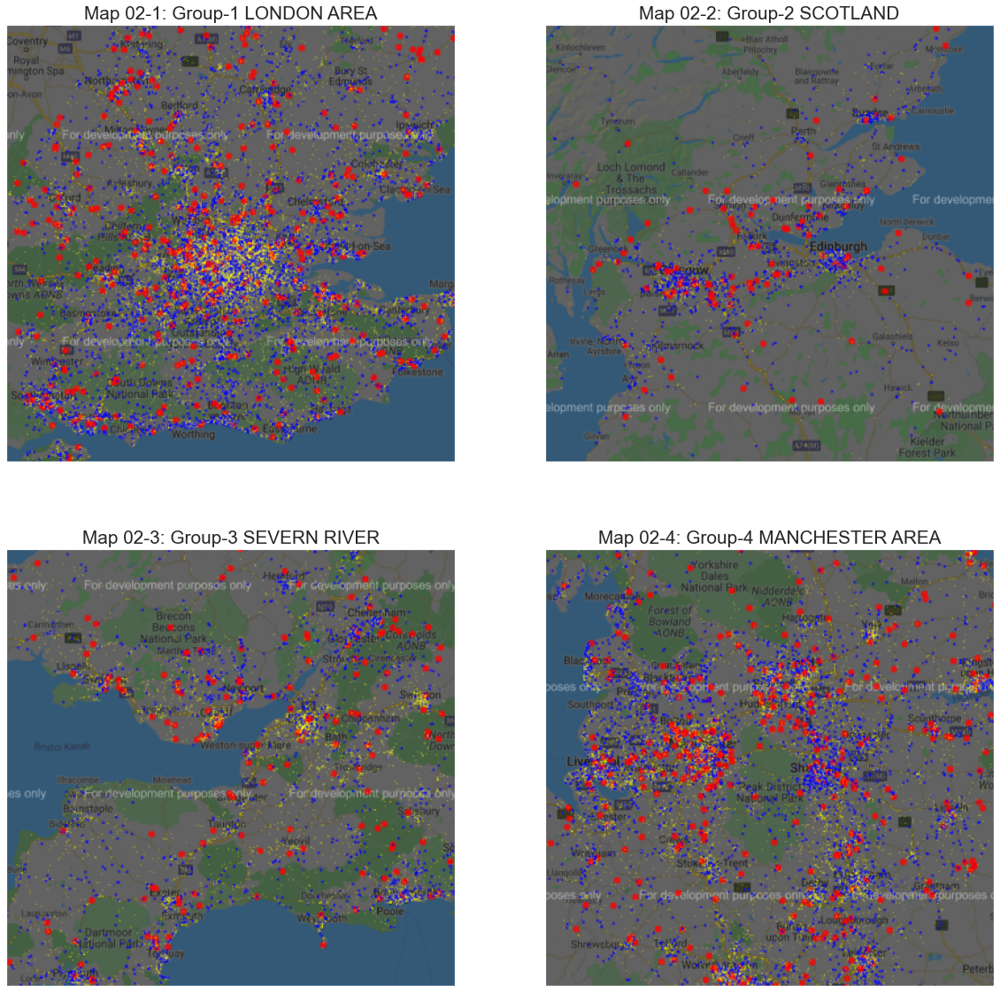

In [32]:
London = mpimg.imread(r"./data/Group_0.png")
Scotland = mpimg.imread(r"./data/Group_1.png")
Severn = mpimg.imread(r"./data/Group_2.png")
Manchester = mpimg.imread(r"./data/Group_3.png")

fig, ax = plt.subplots(2,2, figsize=(20,20))

ax[0][0].imshow(London, aspect="auto")
ax[0][0].set_title("Map 02-1: Group-1 LONDON AREA", loc="center", size="xx-large")
ax[0][0].tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
ax[0][0].grid(False)

ax[0][1].imshow(Scotland, aspect="auto")
ax[0][1].set_title("Map 02-2: Group-2 SCOTLAND", loc="center", size="xx-large")
ax[0][1].tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
ax[0][1].grid(False)

ax[1][0].imshow(Severn, aspect="auto")
ax[1][0].set_title("Map 02-3: Group-3 SEVERN RIVER", loc="center", size="xx-large")
ax[1][0].tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
ax[1][0].grid(False)

ax[1][1].imshow(Manchester, aspect="auto")
ax[1][1].set_title("Map 02-4: Group-4 MANCHESTER AREA", loc="center", size="xx-large")
ax[1][1].tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
ax[1][1].grid(False)


Above plots display each cluster that KNN algorithm determined. 
In each plot;
- Big red circles represents **"Fatal accidents"**
- Blue circles represents **"Serious accidents"**
- Small yellow dots are **"Slight accidents"**  

You can notice that, accidents in major cities are mostly "Slight" or "Serious". But; 
   * There seems to be an exception in Manchester city, I can observe that there are numerous **Fatal** accidents in town.
   * Also road (seems to be **M8**) connecting Glasgow and Edinburgh seems to witness numerous **Fatal** accidents. *(We will go deeper in recidivous roads in following plots)*

Now we can see pattern for all accidents. But what about our focus group **"Major Incidents"**? Do they follow the same pattern?

After this brief overview of the complete data, now we are ready to focus on **Major incidents**

## **2-B) MAJOR INCIDENTS:**<a id="Major"></a>

After observing the patterns in timings and severity of the accidents, next we will check whether those accidents are **"Major"** or not. Also, we will plot the **percentage** of the major accidents for each hour, alongside the counts, in order to capture any high percentage of Major accidents with low count.  

Finally, i want to see whether those occurrences of major incidents are same in **urban and rural** areas.

In [33]:
df_major = df_label[df_label["Is_Major"]== True].copy()

In [34]:
df_label["hour_perc"] = df_label["hour"].map(major_perc("hour"))

In [35]:
weekend = df_label[(df_label["Is_Major"]==True)&(df_label["Weekend"]=="weekend")][["hour","hour_perc", "urban_or_rural_area"]].sort_values(by="hour")

In [36]:
weekday = df_label[(df_label["Is_Major"]==True)&(df_label["Weekend"]=="weekday")][["hour","hour_perc", "urban_or_rural_area"]].sort_values(by="hour")

In [37]:
t_night_we = df_major[(df_major["hour"]<6)&(df_major["Weekend"]=="weekend")]["hour"].value_counts().mean()
t_night_wd = df_major[(df_major["hour"]<6)&(df_major["Weekend"]=="weekday")]["hour"].value_counts().mean()
t_day_we = df_major[(df_major["hour"]>5)&(df_major["hour"]<19)&(df_major["Weekend"]=="weekend")]["hour"].value_counts().mean()
t_day_wd = df_major[(df_major["hour"]>5)&(df_major["hour"]<19)&(df_major["Weekend"]=="weekday")]["hour"].value_counts().mean()
t_ev_we = df_major[(df_major["hour"]>18)&(df_major["Weekend"]=="weekend")]["hour"].value_counts().mean()
t_ev_wd = df_major[(df_major["hour"]>18)&(df_major["Weekend"]=="weekday")]["hour"].value_counts().mean()

### **2-B-1) TIME ANALYSIS - MAJOR INCIDENTS:**<a id="tmajor"></a>

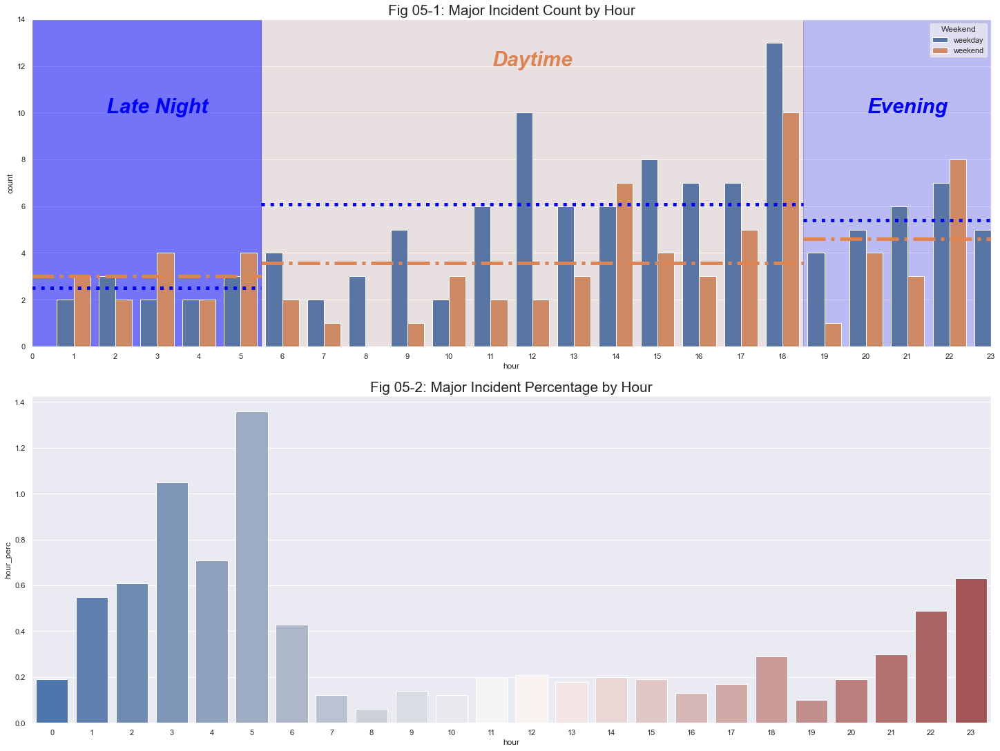

In [38]:
fig, ax = plt.subplots(2,1,figsize=(20,15), constrained_layout=True)

sns.countplot(x="hour", hue="Weekend", data=df_major,  ax=ax[0])
sns.barplot(x="hour", y="hour_perc", data=df_label,  ax=ax[1], palette="vlag")
sns.set_theme(style="darkgrid")

ax[0].set_title("Fig 05-1: Major Incident Count by Hour", loc="center", size="xx-large")
ax[1].set_title("Fig 05-2: Major Incident Percentage by Hour", loc="center", size="xx-large")

ax[0].text(x=3, y=10, ha='center', s='Late Night', fontsize=30, color="blue", style='oblique', weight='demi')
ax[0].text(x=12, y=12, ha='center', s='Daytime', fontsize=30, color="C1", style='oblique', weight='demi')
ax[0].text(x=21, y=10, ha='center', s='Evening', fontsize=30, color="blue", style='oblique', weight='demi')

ax[0].fill_betweenx([0,14], 5.5, -1, color='blue', alpha=0.5)
ax[0].fill_betweenx([0,14], 5.5, 18.5, color='C1', alpha=0.1)
ax[0].fill_betweenx([0,14], 18.5, 24, color='blue', alpha=0.2)

ax[0].set_xlim(0,23)
ax[0].set_ylim(0,14)

ax[0].plot([0, 5.5], [t_night_we, t_night_we], "k-.", color="C1", linewidth=5)
ax[0].plot([0, 5.5], [t_night_wd, t_night_wd], "k:", color="blue", linewidth=5)

ax[0].plot([5.5, 18.5], [t_day_we, t_day_we], "k-.", color="C1", linewidth=5)
ax[0].plot([5.5, 18.5], [t_day_wd, t_day_wd], "k:", color="blue", linewidth=5)

ax[0].plot([18.5, 23], [t_ev_we, t_ev_we], "k-.", color="C1", linewidth=5)
ax[0].plot([18.5, 23], [t_ev_wd, t_ev_wd], "k:", color="blue", linewidth=5)


Fig 05-1: Plots the **"Major Incident Counts"** of each **hour** both in **weekends and weekdays**. 

Assuming the hours between;
* 00:00 - 06:00 as **Night**,
* 06:00 - 19:00 as **Day**,
* 19:00 - 00:00 as **Evening**.

"Blue" and "Orange" vertical bars are representing **Weekdays** and **Weekends** respectively.

Horizontal, "blue dotted lines" are representing mean count of each time of the day of **Weekdays**.

Horizontal, "orange dashed lines" are representing mean count of each time of the day of **Weekends**.

Fig 05-2: Plots the percentage of **Major incidents** among all accidents took place in respective hour of the day. Since there is no meaningful difference between  percentages in weekends and weekdays, there is no need to display it. 

Let's list the main outcomes of above figures:

1) On weekdays; As seen from the "horizontal blue dotted lines", order of the **average count** of the major accidents are; "Daytime" > "Evening" > "Night"   (Fig 05-1)

2) On weekends; As seen from the "horizontal orange dashed lines", order of the **average count** of the major accidents are; "Evening" > "Daytime" > "Night" (Fig 05-1)

3) Among all the major accidents happened at **night**, most of those took place on **weekends**. (Fig 05-1)

4) Major accidents took place at **daytime** and **evening** are mainly on **weekdays**. (Fig 05-1)

5) Accidents took place when it is **dark** are more likely to be **major**, compared to **daytime** accidents. (Fig 05-2)

 Let's see if the situation is any different in Rural areas...

### **2-B-2) TIME & LOCATION ANALYSIS:**<a id="tloc"></a> 

In [39]:
urb_night_we = weekend[(weekend["hour"]<6)&(weekend["urban_or_rural_area"]=="Urban")]["hour"].value_counts().mean()
rur_night_we = weekend[(weekend["hour"]<6)&(weekend["urban_or_rural_area"]=="Rural")]["hour"].value_counts().mean()

urb_day_we = weekend[(weekend["hour"]>5)&(weekend["hour"]<19)&(weekend["urban_or_rural_area"]=="Urban")]["hour"].value_counts().mean()
rur_day_we = weekend[(weekend["hour"]>5)&(weekend["hour"]<19)&(weekend["urban_or_rural_area"]=="Rural")]["hour"].value_counts().mean()

urb_ev_we = weekend[(weekend["hour"]>18)&(weekend["urban_or_rural_area"]=="Urban")]["hour"].value_counts().mean()
rur_ev_we = weekend[(weekend["hour"]>18)&(weekend["urban_or_rural_area"]=="Rural")]["hour"].value_counts().mean()

urb_night_wd = weekday[(weekday["hour"]<6)&(weekday["urban_or_rural_area"]=="Urban")]["hour"].value_counts().mean()
rur_night_wd = weekday[(weekday["hour"]<6)&(weekday["urban_or_rural_area"]=="Rural")]["hour"].value_counts().mean()

urb_day_wd = weekday[(weekday["hour"]>5)&(weekday["hour"]<19)&(weekday["urban_or_rural_area"]=="Urban")]["hour"].value_counts().mean()
rur_day_wd = weekday[(weekday["hour"]>5)&(weekday["hour"]<19)&(weekday["urban_or_rural_area"]=="Rural")]["hour"].value_counts().mean()

urb_ev_wd = weekday[(weekday["hour"]>18)&(weekday["urban_or_rural_area"]=="Urban")]["hour"].value_counts().mean()
rur_ev_wd = weekday[(weekday["hour"]>18)&(weekday["urban_or_rural_area"]=="Rural")]["hour"].value_counts().mean()

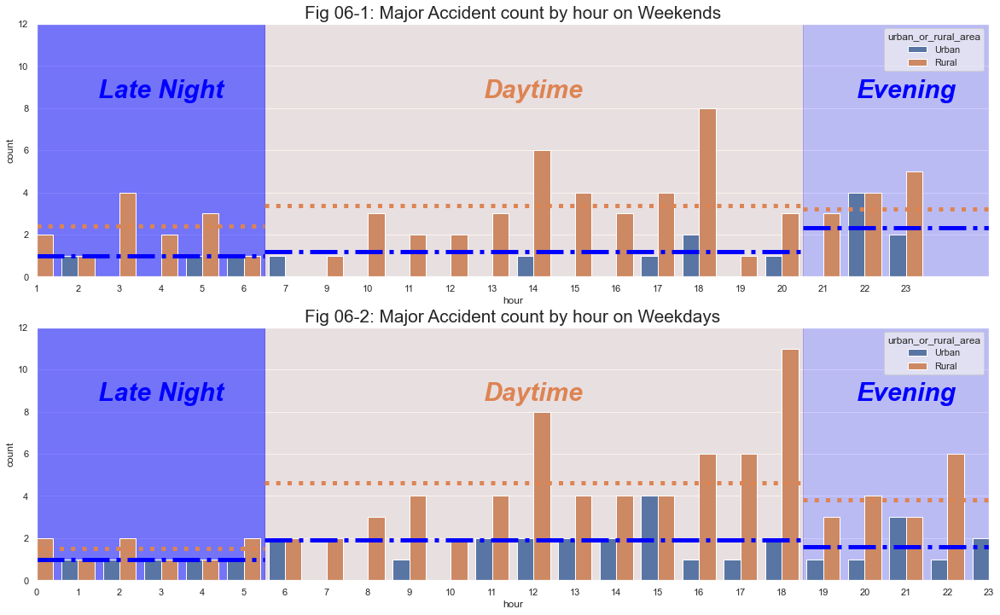

In [40]:
fig, ax = plt.subplots(2,1, figsize=(20,12))

labels = np.arange(24)

sns.countplot(x="hour", hue="urban_or_rural_area", hue_order = ["Urban", "Rural"], data=weekend, ax=ax[0])
sns.countplot(x="hour", hue="urban_or_rural_area", hue_order = ["Urban", "Rural"], data=weekday, ax=ax[1])
sns.set_theme(style="darkgrid")


ax[0].set_title("Fig 06-1: Major Accident count by hour on Weekends", loc="center", size="xx-large")
ax[1].set_title("Fig 06-2: Major Accident count by hour on Weekdays", loc="center", size="xx-large")

for i in range(2):
    ax[i].text(x=3, y=8.5, ha='center', s='Late Night', fontsize=30, color="blue", style='oblique', weight='demi')
    ax[i].text(x=12, y=8.5, ha='center', s='Daytime', fontsize=30, color="C1", style='oblique', weight='demi')
    ax[i].text(x=21, y=8.5, ha='center', s='Evening', fontsize=30, color="blue", style='oblique', weight='demi')
    ax[i].fill_betweenx([0,12], 5.5, -1, color='blue', alpha=0.5)
    ax[i].fill_betweenx([0,12], 5.5, 18.5, color='C1', alpha=0.1)
    ax[i].fill_betweenx([0,12], 18.5, 24, color='blue', alpha=0.2)
    ax[i].set_xlim(0,23)
    ax[i].set_ylim(0,12)
ax[0].plot([0, 5.5], [urb_night_we, urb_night_we], "k-.", color="blue", linewidth=5)
ax[0].plot([0, 5.5], [rur_night_we, rur_night_we], "k:", color="C1", linewidth=5)

ax[0].plot([5.5, 18.5], [urb_day_we, urb_day_we], "k-.", color="blue", linewidth=5)
ax[0].plot([5.5, 18.5], [rur_day_we, rur_day_we], "k:", color="C1", linewidth=5)

ax[0].plot([18.5, 23], [urb_ev_we, urb_ev_we], "k-.", color="blue", linewidth=5)
ax[0].plot([18.5, 23], [rur_ev_we, rur_ev_we], "k:", color="C1", linewidth=5)

ax[1].plot([0, 5.5], [urb_night_wd, urb_night_wd], "k-.", color="blue", linewidth=5)
ax[1].plot([0, 5.5], [rur_night_wd, rur_night_wd], "k:", color="C1", linewidth=5)

ax[1].plot([5.5, 18.5], [urb_day_wd, urb_day_wd], "k-.", color="blue", linewidth=5)
ax[1].plot([5.5, 18.5], [rur_day_wd, rur_day_wd], "k:", color="C1", linewidth=5)

ax[1].plot([18.5, 23], [urb_ev_wd, urb_ev_wd], "k-.", color="blue", linewidth=5)
ax[1].plot([18.5, 23], [rur_ev_wd, rur_ev_wd], "k:", color="C1", linewidth=5)



Fig 06-1 and  Fig 06-02: Plots the **"Major Incident Counts"** of each **hour** in **rural and urban** areas both on **weekends and weekdays** respectively. 

Making the same assumptions about **day/night** times with previous plot, Fig 06 draws; 

* "Blue" and "Orange" bars to represent **Urban** and **Rural** areas respectively,

* Horizontal, "orange dotted lines" to represent mean count of each time of the day in **Urban** areas,

* Horizontal, "blue dashed lines" to represent mean count of each time of the day in **Rural** areas.

Let's list the main outcomes of above figures:

1) **Major incidents** are significantly higher in **Rural** compared to **Urban** areas;
    * **Rural** = 153
    * **Urban** = 49
    
    The reason behind this trend seems to be the speed limit. Median speed limit in; **Rural** areas is **60** where in **Urban** areas it is **30** ↙️

In [41]:
df_label.groupby("urban_or_rural_area")[["speed_limit"]].agg(["median", "mean"]).round()

speed_limit      
                         median  mean
urban_or_rural_area                  
Rural                        60  50.0
Urban                        30  30.0

2) On weekdays; there is no change in order of the **average count of major accidents** in **Rural** and **Urban** areas; "Daytime" > "Evening" > "Night" (Fig 06-2)

3) On weekends; As seen in Fig 06-1, order of the **average count of major accidents** are; 
    * **Urban** : "Evening" > "Daytime" > "Night"!!!
    * **Rural** : "Daytime">"Evening">"Night"


4) **Late night** major incidents are increasing in **Rural** areas on **weekends** but do not change significantly in **Urban** areas.

5) **Evening** major incidents are increasing in **Urban** areas on **weekends** but do not change significantly in **Rural** areas. Weekend parties seem to last longer in Rural areas 🥳 

6) Both in Urban and Rural areas, Major incident counts are higher on weekdays. This is something expected, since the total number of accidents are drastically high in weekdays. So we need ,also, to observe the frequency of Major incidents respective to **"weekend & weekday"** and **"urban & rural"**. Please find below ↙️


In [42]:
major_we_urb = df_major[(df_major["Weekend"]=="weekend")&(df_major["urban_or_rural_area"]=="Urban")]["Is_Major"].count()
major_we_rur = df_major[(df_major["Weekend"]=="weekend")&(df_major["urban_or_rural_area"]=="Rural")]["Is_Major"].count()
major_wd_urb = df_major[(df_major["Weekend"]=="weekday")&(df_major["urban_or_rural_area"]=="Urban")]["Is_Major"].count()
major_wd_rur = df_major[(df_major["Weekend"]=="weekday")&(df_major["urban_or_rural_area"]=="Rural")]["Is_Major"].count()
major_list = [major_we_urb,major_we_rur,major_wd_urb,major_wd_rur]

In [43]:
total_we_urb = df_label[(df_label["Weekend"]=="weekend")&(df_label["urban_or_rural_area"]=="Urban")]["hour"].count()
total_we_rur = df_label[(df_label["Weekend"]=="weekend")&(df_label["urban_or_rural_area"]=="Rural")]["hour"].count()
total_wd_urb = df_label[(df_label["Weekend"]=="weekday")&(df_label["urban_or_rural_area"]=="Urban")]["hour"].count()
total_wd_rur = df_label[(df_label["Weekend"]=="weekday")&(df_label["urban_or_rural_area"]=="Rural")]["hour"].count()
total_list = [total_we_urb,total_we_rur,total_wd_urb,total_wd_rur]

In [44]:
perc_list = []
for m,t in zip(major_list, total_list):
    perc = (m/t)*10000
    perc_list.append(round(perc,2))

In [45]:
weekend_urban = perc_list[0]
weekend_rural = perc_list[1]
weekday_urban = perc_list[2]
weekday_rural = perc_list[3]
print("""Among 10.000 accidents in;
Urban areas on \033[1mWeekends, {}\033[0m of them are Major,
Urban areas on Weekdays, \033[1m{}\033[0m of them are Major,
Rural areas on \033[1mWeekends, {}\033[0m of them are Major,
Rural areas on Weekdays, \033[1m{}\033[0m of them are Major
""".format(weekend_urban, weekday_urban, weekend_rural, weekday_rural))


Among 10.000 accidents in;
Urban areas on Weekends, 10.82 of them are Major,
Urban areas on Weekdays, 7.03 of them are Major,
Rural areas on Weekends, 82.69 of them are Major,
Rural areas on Weekdays, 40.77 of them are Major



So as suspected Weekends are not as innocent as seen in the figures. See how high the frequency on weekends in Rural ares...

We have checked the patterns as Weekend & Weekdays for better representation. Now we can extend our search and observe the patterns within these groups. 

Text(0.5, 1.0, 'Fig 07: Major Accident count of Weekend Days by hour')

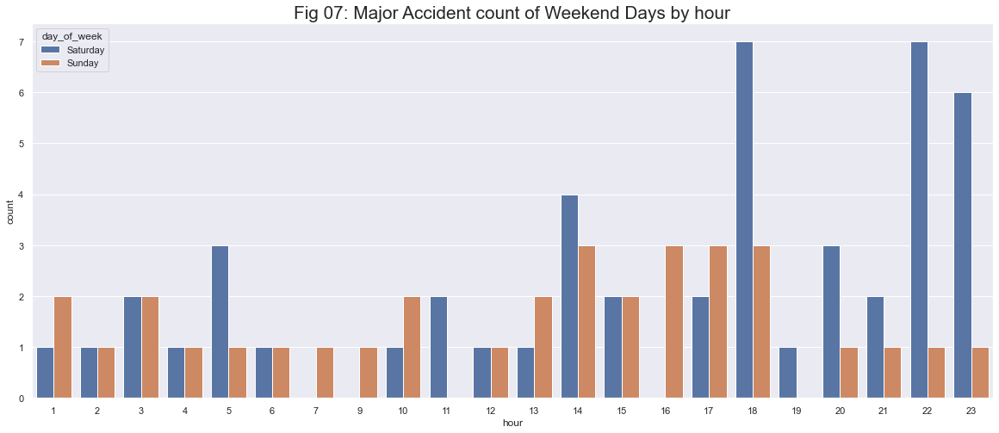

In [46]:
hue_order = ["Saturday","Sunday"]
fig, ax = plt.subplots(figsize=(20,8))
sns.set_theme(style="darkgrid")
sns.countplot(x="hour", hue="day_of_week", hue_order =hue_order, data=df_major[df_major["Weekend"]=="weekend"], dodge=True)
ax.set_title("Fig 07: Major Accident count of Weekend Days by hour", loc="center", size="xx-large")

#### *"Saturday Night Fever!"*  🕺

Well, it is not surprising to observe that Saturdays are way ahead of Sundays when it comes to major incidents. Specifically at 18:00, 22:00 and 23:00 peaks are easy to observe. 

Text(20, 3.5, 'Friday')

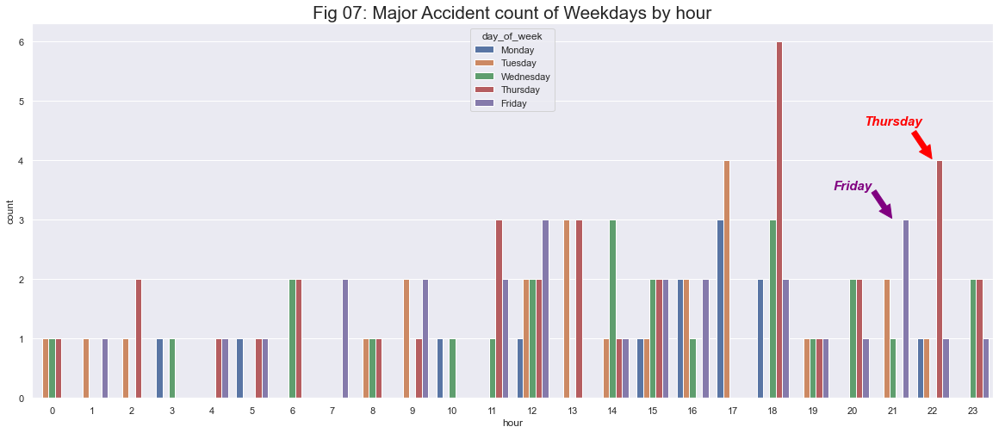

In [47]:
hue_order = ["Monday","Tuesday","Wednesday","Thursday","Friday"]
fig, ax = plt.subplots(figsize=(20,8))
sns.set_theme(style="darkgrid")
sns.countplot(x="hour", hue="day_of_week", hue_order =hue_order, data=df_major[df_major["Weekend"]=="weekday"], dodge=True)
ax.set_title("Fig 07: Major Accident count of Weekdays by hour", loc="center", size="xx-large")

arrow1 = mpatches.FancyArrowPatch((21.5, 4.5), (22, 4), mutation_scale=30, color="red")
arrow2 = mpatches.FancyArrowPatch((20.5, 3.5), (21,3), mutation_scale=30, color="purple")

ax.add_patch(arrow1)
ax.add_patch(arrow2)

ax.text(x=21, y=4.6, ha='center', s='Thursday', fontsize=15, color="red", style='oblique', weight='demi')
ax.text(x=20, y=3.5, ha='center', s='Friday', fontsize=15, color="purple", style='oblique', weight='demi')

Have you ever heard the  phrase *"Thursday is the hidden Saturday"* ?

I have hear this from a friend who owns a restaurant. They call Thursday as **hidden Saturday** because, unexpectedly, Thursdays are always as crowded as Saturdays. This graph proves my friend. 

The very same pattern that we already observed can also be seen in Fig 07. What is new is **Thursday**, you can see it has a peak both in after work hours(18:00) and party hours(22:00), even higher than **Friday** and identical as **Saturday**. 

### **2-B-3) GOOGLE API & CLUSTERING - MAJOR INCIDENTS**<a id="Bonus2"></a>

Let's run another KNN but this time only for **Major Incidents**. Then plot them one more time on a Google Map and see if we can catch something new...

In [48]:
X=df_major[['latitude','longitude']]
X.shape

(202, 2)

In [49]:
clusters = np.arange(1,20)
major_inertias = []
for n in clusters:
    km = KMeans(n_clusters=n)
    km.fit_transform(X)
    major_inertias.append(km.inertia_)

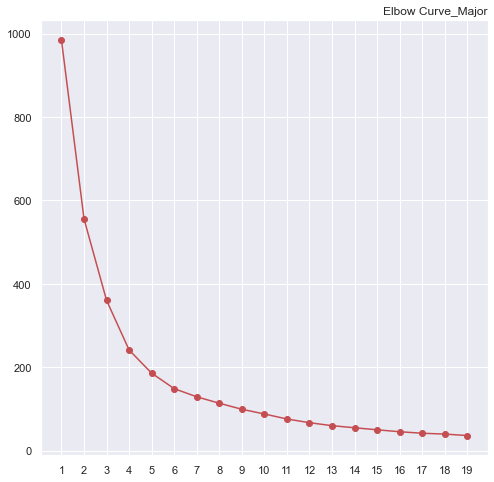

In [50]:
fig, ax = plt.subplots(figsize=(8,8))
ax.plot(clusters, major_inertias,'-ro')
ax.set_title('Elbow Curve_Major', loc='right')
ax.set_xticklabels(np.arange(1,20))
ax.set_xticks(np.arange(1,20))

This time I am not that certain, one may decide to chose 5 or even 6 clusters but I again will go with 4 for ease of comparison.

In [51]:
model_m = KMeans(n_clusters=4)
model_m.fit(X)
df_major.loc[:,["clusters"]] = model_m.labels_
centers = model_m.cluster_centers_ 

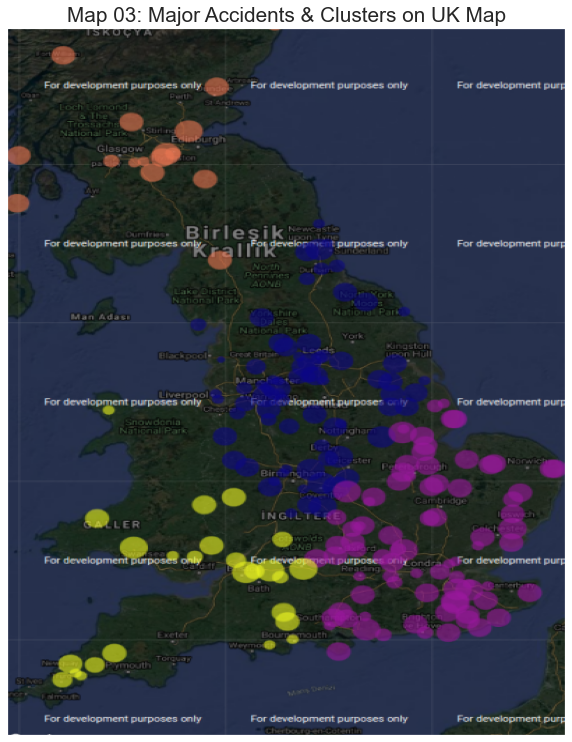

In [52]:
Major_clusters = mpimg.imread(r"./data/Major_clusters.png")
fig, ax = plt.subplots(figsize=(10,13))
ax.imshow(Major_clusters, aspect="auto")
ax.set_title("Map 03: Major Accidents & Clusters on UK Map", loc="center", size="xx-large")
ax.tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
ax.grid(False)

When we plot the 4 clusters of major incidents(Map 03), you can notice that, it is almost identical with the clusters of all accidents. So we may conclude that there is no significant concentration in major incidents among UK. This means we need to zoom to each cluster to search for patterns.

Additionally; I took the liberty to also indicate the speed limits by the size of the circles, in order to observe the relation between speed limits, location and major incidents. 

I have noticed that;
* Speed limits are reasonably higher in Rural areas,
* Most of the major incidents seems to happen in high speed limit roads. This sounds important, let's have a deeper look.

<a id="map04"></a>

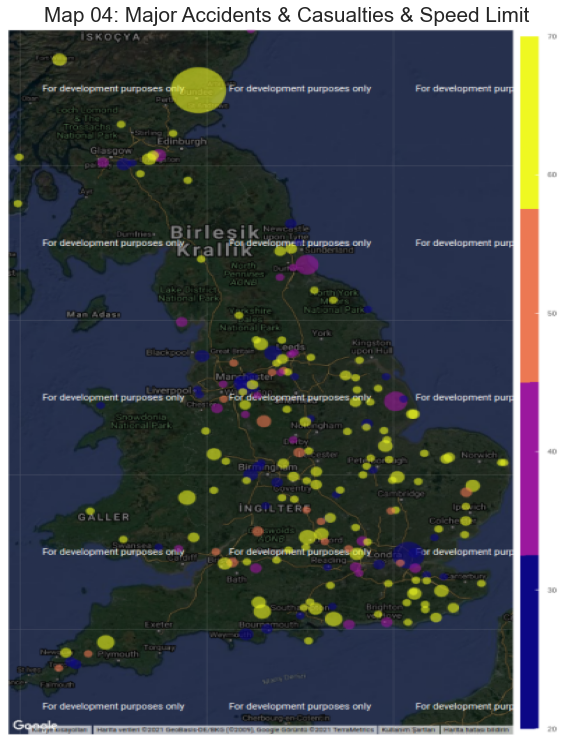

In [53]:
Major_speed = mpimg.imread(r"./data/Major_speed.png")
fig, ax = plt.subplots(figsize=(10,13))
ax.imshow(Major_speed, aspect="auto")
ax.set_title("Map 04: Major Accidents & Casualties & Speed Limit", loc="center", size="xx-large")
ax.tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
ax.grid(False)

"Map 04" is a better indicator of speed limit to both **major incidents** and **number of casualties**. 

As you can see from the colorbar on the right of the map, yellow represents the highest speed limit category of our dataset. It is quite self explanatory as yellows are all over the map. 

Also size of the circles represent the number of casualties in each major incidents, I believe you have already noticed the big yellow circle near Dundee...

Below is the "**row** 88249" representing that accident.

I want to attach the "exact location" and the "news link" of the accident, to remind myself that these are not just **"rows"** in a dataset.

https://news.stv.tv/uncategorized/rush-hour-crash-between-bus-and-van-closes-part-of-a90?top

In [54]:
df_major[df_major["number_of_casualties"]==19]

,longitude,latitude,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,first_road_class,first_road_number,road_type,speed_limit,junction_detail,junction_control,second_road_class,second_road_number,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,Is_Major,month,hour,season,Weekend,clusters
88249,-2.939728,56.548322,Fatal,2,19,2020-12-03,Thursday,1900-01-01 08:02:00,A,928,Dual carriageway,60,T or staggered junction,Give way or uncontrolled,A,90,None within 50 metres,No physical crossing facilities within 50 metres,Daylight,Fine no high winds,Wet or damp,None,None,Rural,True,12,8,winter,weekday,2


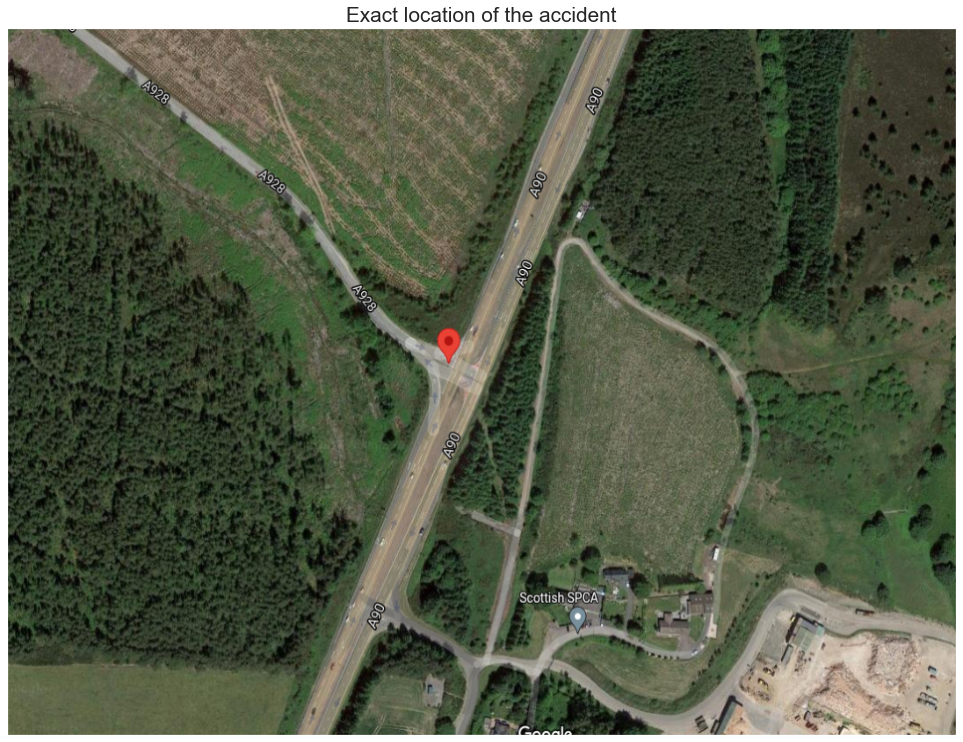

In [55]:
Major_speed = mpimg.imread(r"./data/most_1080.jpg")
fig, ax = plt.subplots(figsize=(17,13))
ax.imshow(Major_speed, aspect="auto")
ax.set_title("Exact location of the accident", loc="center", size="xx-large")
ax.tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
ax.grid(False)

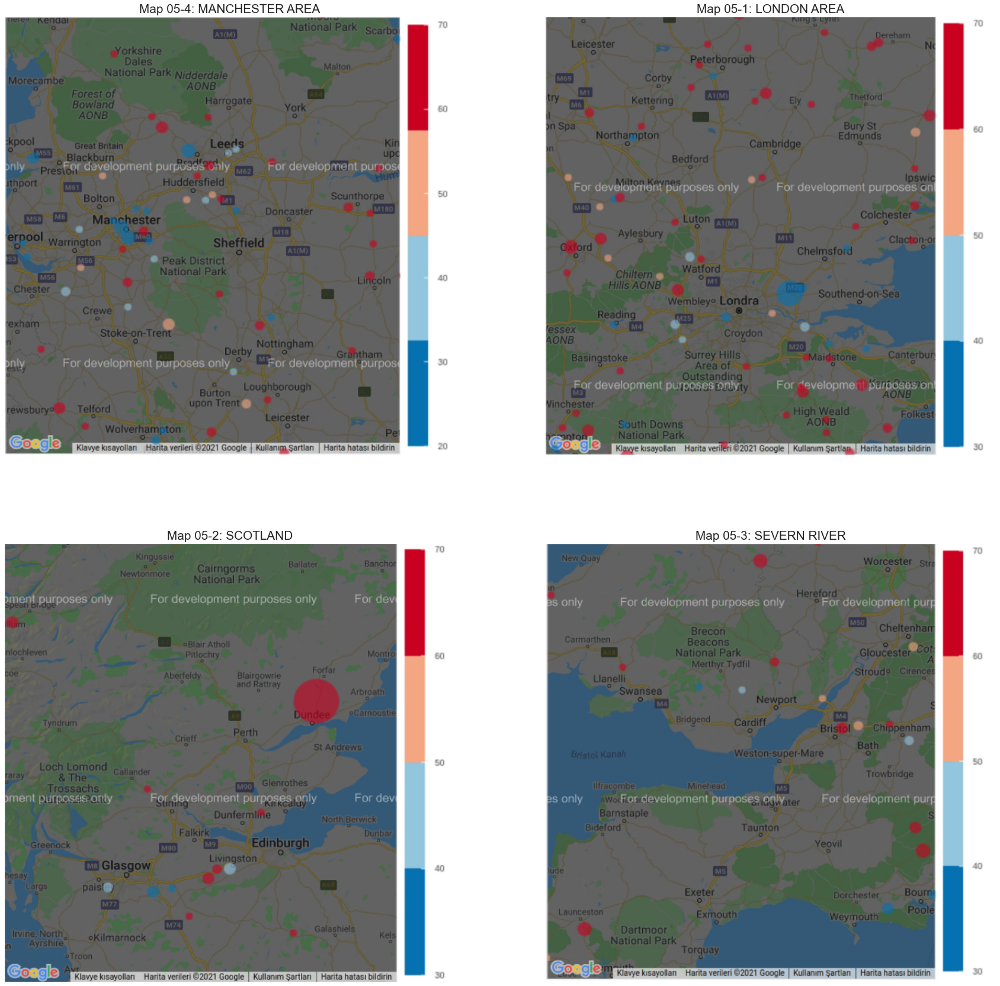

In [56]:
major_1 = mpimg.imread(r"./data/major_1.jpg")
major_2 = mpimg.imread(r"./data/major_2.jpg")
major_3 = mpimg.imread(r"./data/major_3.jpg")
major_4 = mpimg.imread(r"./data/major_4.jpg")

fig, ax = plt.subplots(2,2, figsize=(30,30))

ax[0][0].imshow(major_1, aspect="auto")
ax[0][0].set_title("Map 05-4: MANCHESTER AREA", loc="center", size="xx-large")
ax[0][0].tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
ax[0][0].grid(False)

ax[0][1].imshow(major_2, aspect="auto")
ax[0][1].set_title("Map 05-1: LONDON AREA", loc="center", size="xx-large")
ax[0][1].tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
ax[0][1].grid(False)

ax[1][0].imshow(major_3, aspect="auto")
ax[1][0].set_title("Map 05-2: SCOTLAND", loc="center", size="xx-large")
ax[1][0].tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
ax[1][0].grid(False)

ax[1][1].imshow(major_4, aspect="auto")
ax[1][1].set_title("Map 05-3: SEVERN RIVER", loc="center", size="xx-large")
ax[1][1].tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
ax[1][1].grid(False)

* "Map 05-04" proves the exception that we have noticed in "Map 02-4" about the "Manchester Area" cluster; atypically, Manchester has a high count of major incidents in city center. Moreover, what we couldn't notice from Map02-4, also Leeds has a number of major incidents in Urban areas. This is something to be investigated in detail in a more focused study.

* Most of the major accidents near London seems to be in **Rural** areas and now it is visible why... Almost all of those major incidents took place in **high speed** roads !!

* Scotland group is also indicates that our previous("Map 02-2") inference is true. The **roads between Glasgow and Edinburgh** shall be subjected to a further study.

* The number of major incidents in the Severn River cluster, seems to share similar characteristics with London cluster. Most of the major incidents are in **Rural** areas in **high speed** roads. Also we can make the same observation for **M4**, that we made in Map 02-2 for **M8**. It is clear that we need to concentrate more on motorways to reduce number of major accidents.

### **2-B-4) SEASONAL EFFECTS:**<a id="Season"></a>

I also want to check the seasonal effect on the major accidents with following comparisons;
* First we will compare the counts of major accidents in each **month** both in **rural** and **urban** areas,
* Then we will display those accidents and **number of casualties** on UK map, to check whether if some areas are more sensitive to seasonal conditions. 

Text(0.5, 1.0, 'Fig 08-2: Seasons & Major Accidents in Urban & Rural')

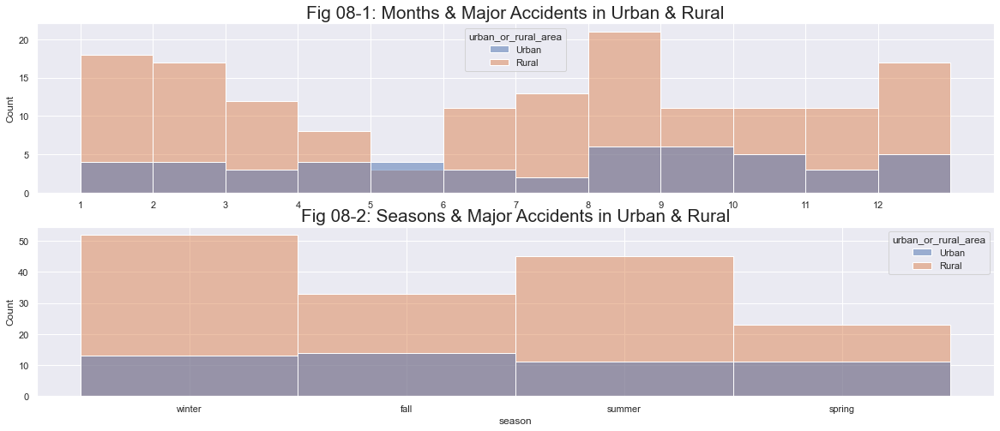

In [57]:
fig, ax = plt.subplots(2,1)
sns.histplot(x="month", hue="urban_or_rural_area", data=df_major, bins=np.arange(1,14),ax=ax[0])
sns.histplot(x="season", hue="urban_or_rural_area", data=df_major, ax=ax[1])

ax[0].set_title("Fig 08-1: Months & Major Accidents in Urban & Rural", loc="center", size="xx-large")
ax[0].set(xlabel=None)
ax[0].set_xticklabels(np.arange(1,13))
ax[0].set_xticks(np.arange(1,13))
ax[1].set_title("Fig 08-2: Seasons & Major Accidents in Urban & Rural", loc="center", size="xx-large")


As it is observable that there is a pattern in months that the major accidents happen in Fig 08-1; second plot shows the pattern more clearly as the months are aggregated to seasons.

From the plots we can infer that Major accidents more happen in;
* **winter and summer** seasons in **rural** areas,
* **winter and fall** seasons in **urban** areas.


***Assumption:** People plan their holidays to rural areas, more on winter and summer seasons, this trend increases the population in rural areas.* 

My impression based on the assumption above, is that major incidents seem to be more effected by;

* weather conditions in **urban** areas,
* and more by population in **rural** areas,  

I found it interesting and my assumption is clearly subject to a future study.

Text(0.5, 1.0, 'Map 06-2: Seasons & Casualties of Major Accidents')

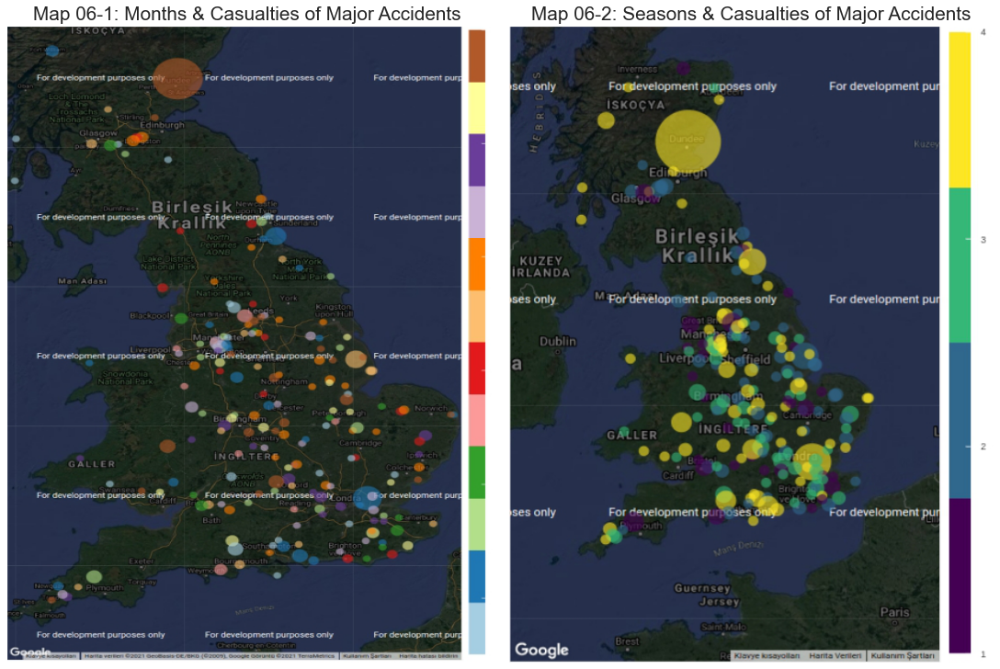

In [58]:
rcParams['figure.figsize'] = 15 ,10

month_count = mpimg.imread(r"./data/Acc&Month&Cas.jpg")
season_count = mpimg.imread(r"./data/Acc&Season&Cas.jpg")

fig, ax = plt.subplots(1,2, constrained_layout=True
                      )
for i in range(2):
    ax[i].tick_params(which="both", bottom=False, left=False, labelbottom=False, labelleft=False)
    ax[i].grid(False)


ax[0].imshow(month_count, aspect="auto")
ax[0].set_title("Map 06-1: Months & Casualties of Major Accidents ", loc="center", size="xx-large")
ax[1].imshow(season_count, aspect="auto")
ax[1].set_title("Map 06-2: Seasons & Casualties of Major Accidents", loc="center", size="xx-large")


Map 06-1 plots locations of major accidents, different colors for each month and size of the circles represent number of casualties.

Map 06-2 is a better display of seasonal effect on locations of major incidents displaying different colors for each season.

Matching with the inferences of previous observations; these plots additionally displays the increased number of casualties in winter season...

### **2-B-5) EFFECTS OF OTHER CONDITIONS:**<a id="other"></a>

Our final analysis will be on the conditions observed in scenes of major accidents. 

The count of major accidents in given conditions can be misleading when taken as the only metric. 

Let me explain my point with an example:

*Let's say 300 days of the year is sunny, 50 days are rainy and 15 days are snowy in a country named X.* 

*Also, it is given that 150 accidents happened in sunny☀️, 100 in rainy⛈️ and 60 in snowy ❄️ days.*

*Based on the number of accidents in our imaginary tropical paradise X;*

* *majority of the accidents happened in sunny days??*
* *but when we look closer we can see that only in %50☀️ of the sunny days there is an accident in X,*
* *whereas this percentage is; %200⛈️ in rainy days and %600❄️ in snowy days*

Since we aim to reduce major accidents by taking precautions, we have to focus on the extra danger added by each condition. But this can not be our only metric. 
Percentage can be interpreted as the danger related with that condition. Also, we need to take the magnitude of that danger into consideration. If a big meteorite hits the Earth it would end the life on Earth but today this is not our biggest problem since the probability of that is approx. <a href="https://en.wikipedia.org/wiki/Impact_event#:~:text=happen%20approximately%20once%20every%20twenty%20million%20years.%5B18%5D/">once in twenty million years</a>.

For that reason; we will plot "**added danger**" by the given condition and the "**accident count**" in that condition together.

#### **WEATHER CONDITIONS**<a id="weather"></a>

For weather conditions, our threshold shall be **"Fine no high winds"** condition. So that we will be able to measure the extra danger when the weather is **not fine**!!

In [59]:
df_major["weather_major_%"] = df_major["weather_conditions"].map(major_perc("weather_conditions"))

In [60]:
df_major["weather_major_count"] = df_major["weather_conditions"].map(major_count("weather_conditions"))

array([<AxesSubplot:title={'center':'Fig 09-1: Added danger by weather_conditions'}>,
       <AxesSubplot:title={'center':'Fig 09-2: Count of major accidents '}>],
      dtype=object)

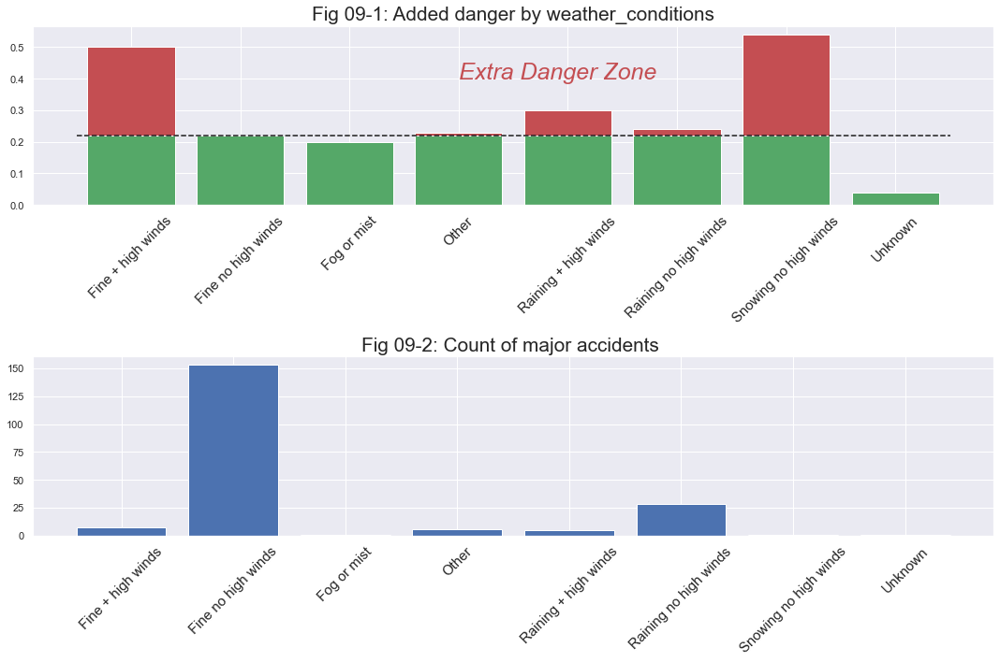

In [61]:
plot_danger_freq("weather_conditions", "Fine no high winds", 
                 "weather_major_%", "weather_major_count", 3, 0.4, "Fig 09-1", "Fig 09-2") 

Fig 09-1 and 2 proved our previous point. Can you see how high the count of major accidents in **fine weather**. That is because weather is **fine** most of the time.

⬇️  Below you can find the count of each weather condition in our dataset.

In [62]:
df_label["weather_conditions"].value_counts()

Fine no high winds              70720
Raining no high winds           11581
Other                            2629
Unknown                          2421
Raining + high winds             1665
Fine + high winds                1400
Fog or mist                       510
Snowing no high winds             185
Snowing + high winds               73
Data missing or out of range        1
Name: weather_conditions, dtype: int64

If we agree on our metrics, you can see the effect of high winds to major accidents from Fig 09-1.

#### **ROAD SURFACE CONDITIONS**<a id="rs"></a> 

 For road surface conditions, our threshold shall be **"Dry"** condition.

In [63]:
df_major["surface_major_%"] = df_major["road_surface_conditions"].map(major_perc("road_surface_conditions"))

In [64]:
df_major["surface_major_count"] = df_major["road_surface_conditions"].map(major_count("road_surface_conditions"))

array([<AxesSubplot:title={'center':'Fig 10-1: Added danger by road_surface_conditions'}>,
       <AxesSubplot:title={'center':'Fig 10-2: Count of major accidents '}>],
      dtype=object)

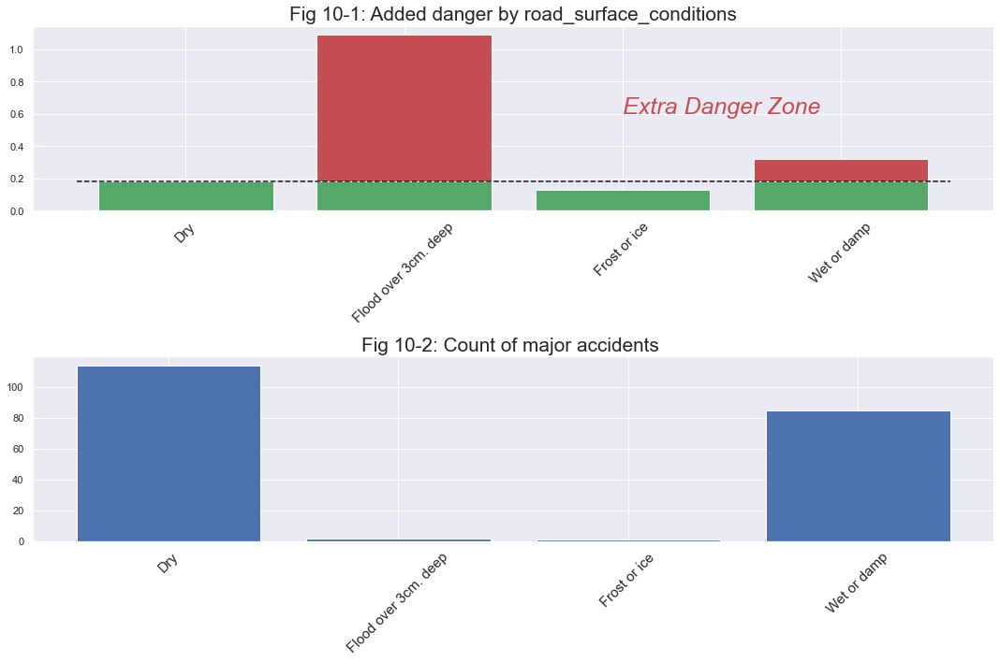

In [65]:
plot_danger_freq("road_surface_conditions", "Dry", 
                 "surface_major_%", "surface_major_count", 2, 0.6, "Fig 10-1", "Fig 10-2") 

As seen from Fig 10-1, Floods are extremely dangerous but rare, where "wet or dump" is both dangerous and common. 

#### **LIGHT CONDITIONS**<a id="light"></a>

For light conditions, our threshold shall be **"Daylight"** condition.

In [66]:
df_major["light_conditions_major_%"] = df_major["light_conditions"].map(major_perc("light_conditions"))

In [67]:
df_major["light_conditions_major_count"] = df_major["light_conditions"].map(major_count("light_conditions"))

array([<AxesSubplot:title={'center':'Fig 11-1: Added danger by light_conditions'}>,
       <AxesSubplot:title={'center':'Fig 11-2: Count of major accidents '}>],
      dtype=object)

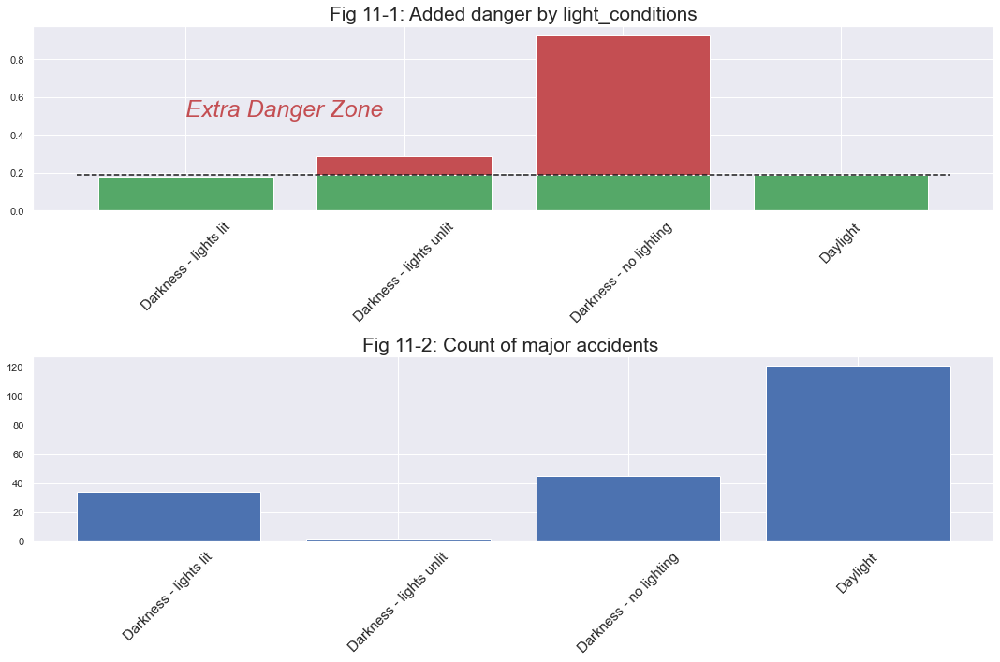

In [68]:
plot_danger_freq("light_conditions", "Daylight", 
                 "light_conditions_major_%", "light_conditions_major_count",
                 0, 0.5, "Fig 11-1", "Fig 11-2") 

Fig 11-1 clearly shows the effect of light on major accidents

#### **CARRIAGEWAY HAZARDS**<a id="cw"></a>

For carriageway hazards, our threshold shall be **"None"**.

In [69]:
df_major["cw_hazards_major_%"] = df_major["carriageway_hazards"].map(major_perc("carriageway_hazards"))

In [70]:
df_major["cw_hazards_major__major_count"] = df_major["carriageway_hazards"].map(major_count("carriageway_hazards"))

array([<AxesSubplot:title={'center':'Fig 12-1: Added danger by carriageway_hazards'}>,
       <AxesSubplot:title={'center':'Fig 12-2: Count of major accidents '}>],
      dtype=object)

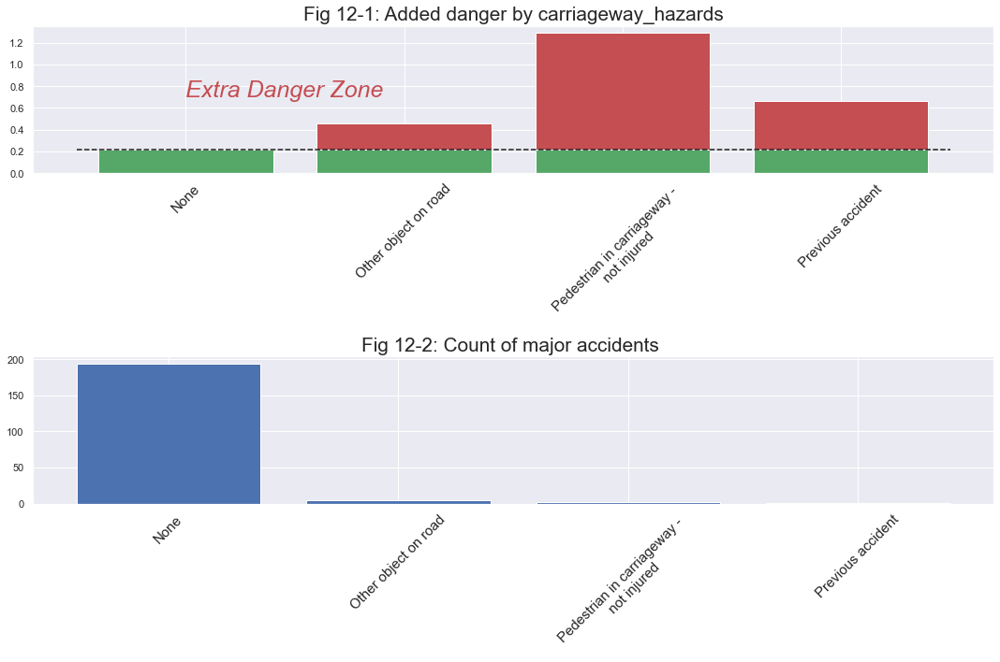

In [71]:
plot_danger_freq("carriageway_hazards", "None", 
                 "cw_hazards_major_%", "cw_hazards_major__major_count",
                 0, 0.7, "Fig 12-1", "Fig 12-2") 

It seems that they are all dangerous but rare...

#### **ROAD TYPE**<a id="rt"></a> 

There is logical threshold for road type, since it is subjective to define "normal" in this feature. One may claim that normal is the most common, which is "single carriageway" but then it is not explanatory. So the best way is just plotting the features and observing the connections. 

In [72]:
df_major["road_type_major_%"] = df_major["road_type"].map(major_perc("road_type"))

In [73]:
df_major["road_type_major_count"] = df_major["road_type"].map(major_count("road_type"))

<a id="roadtype"></a>

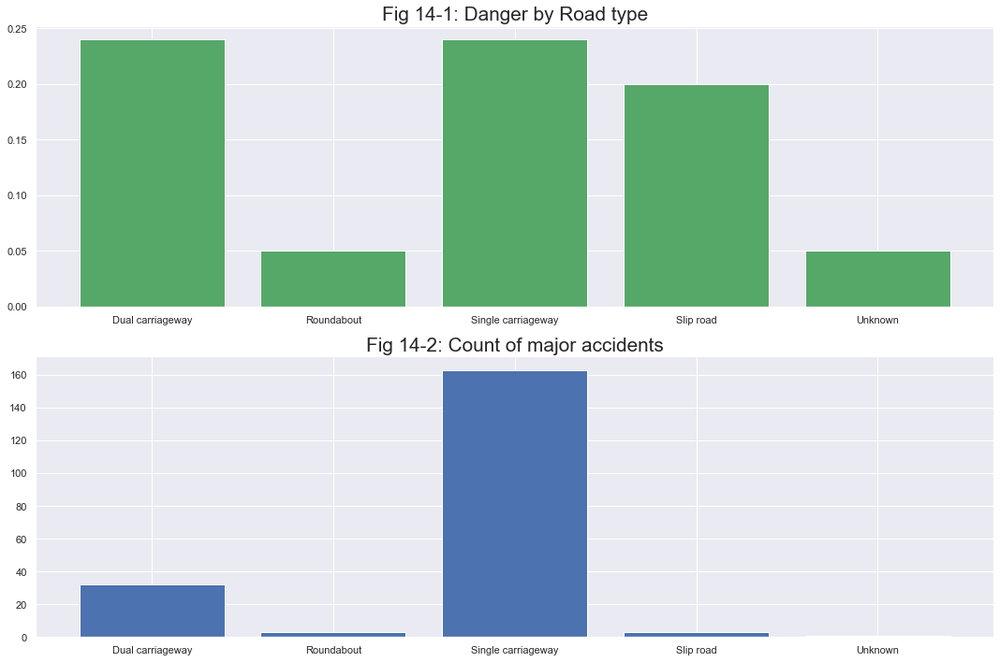

In [74]:
df_gb = df_major.groupby("road_type")[["road_type_major_%", "road_type_major_count"]].mean()
fig, ax = plt.subplots(2,1,figsize=(15,10))
ax[0].bar(df_gb.index , df_gb["road_type_major_%"], color="g")
ax[0].set_title("Fig 14-1: Danger by Road type", loc="center", size="xx-large")
ax[1].bar(df_gb.index , df_gb["road_type_major_count"])
ax[1].set_title("Fig 14-2: Count of major accidents", loc="center", size="xx-large")
plt.tight_layout()

Fig 14-01 and 02 are interesting as they show the danger of **slip roads** and **dual carriageways**. There are not many accidents in that roads but percentage of major incident in that roads are relatively high.

⬇️It must be related with the speed limits of these roads. We have observed the relation of speed limit with major incidents in [Map04](#map04)

In [75]:
df_major.groupby("road_type")[["speed_limit"]].agg(["median","mean"]).sort_values(by=("speed_limit","median"), ascending=False)

speed_limit           
                        median       mean
road_type                                
Dual carriageway            70  60.937500
Slip road                   70  56.666667
Single carriageway          60  49.570552
Unknown                     60  60.000000
Roundabout                  50  46.666667

#### **ROAD CLASS (BOTH)**<a id="rc"></a>

I believe there is no need to study first and second road classes. Because of the larger data availability, I prefer to study first-road_class instead of both. 

Threshold for road class is arbitrarily "B" since the majority (%87) of the roads in UK are in that class according to Wikipedia. 

In [76]:
df_major["road_class_major_%"] = df_major["first_road_class"].map(major_perc("first_road_class"))

In [77]:
df_major["road_class_major_count"] = df_major["first_road_class"].map(major_count("first_road_class"))

array([<AxesSubplot:title={'center':'Fig 15-1: Added danger by first_road_class'}>,
       <AxesSubplot:title={'center':'Fig 15-2: Count of major accidents '}>],
      dtype=object)

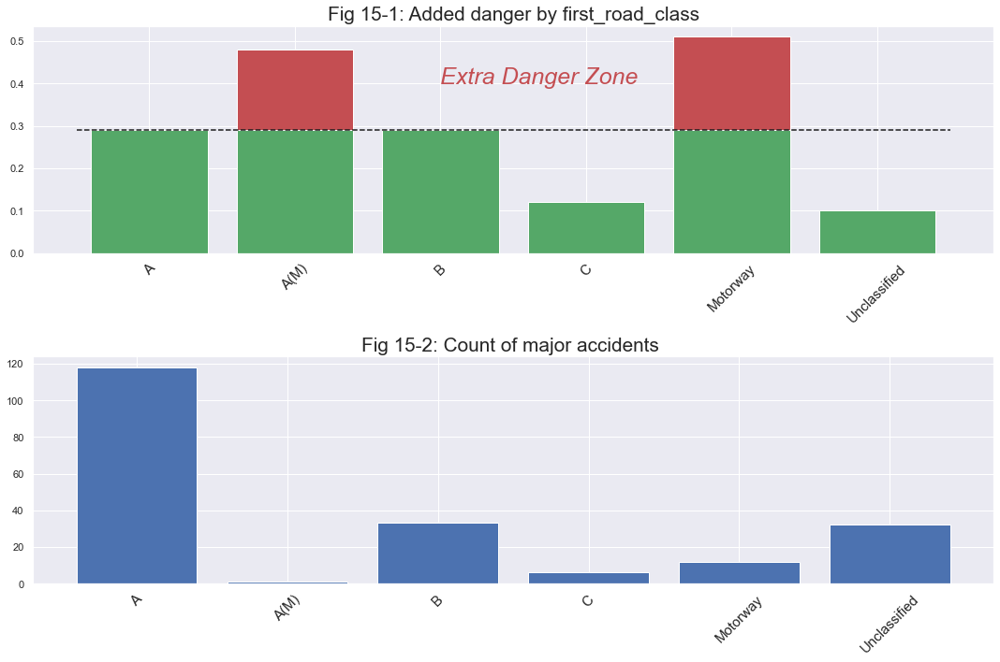

In [78]:
plot_danger_freq("first_road_class", "B", 
                 "road_class_major_%", "road_class_major_count",
                 2, 0.4, "Fig 15-1", "Fig 15-2") 

A(M) is the code for upgraded A roads. Fig 15-01 shows that, as suspected, Motorways and Upgraded A roads are most dangerous road types by our metrics.

⬇️ This is due to the speed limits  in that roads as stated [before](#map04)

In [79]:
df_major.groupby("first_road_class")[["speed_limit"]].median().sort_values(by="speed_limit", ascending=False)

,speed_limit
first_road_class,
A(M),70
Motorway,70
A,60
B,60
Unclassified,50
C,35


#### **JUNCTION DETAIL**<a id="jd"></a>

Since the danger of junctions can be measured by the roads with no junction, our threshold shall be the condition **"Not at junction or within 20 meters"** which turned out to be most dangerous condition later on...

In [80]:
df_major["junc_detail_major_%"] = df_major["junction_detail"].map(major_perc("junction_detail"))

In [81]:
df_major["junc_detail_major_count"] = df_major["junction_detail"].map(major_count("junction_detail"))

Text(2.5, 0.2, 'NO')

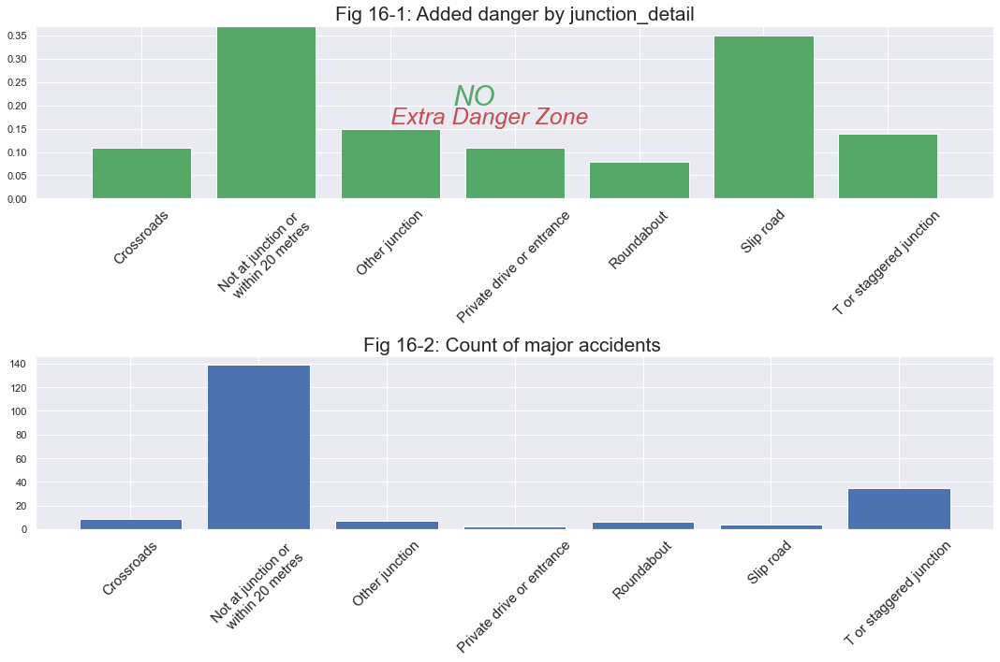

In [82]:
ax = plot_danger_freq("junction_detail", "Not at junction or within 20 metres", 
                 "junc_detail_major_%", "junc_detail_major_count",
                 2, 0.16, "Fig 16-1", "Fig 16-2") 
ax[0].text(2.5,0.2, s="NO", fontsize=30, color="g", style="italic")

Fig 16 shows that the most dangerous junction types are **slip road** (as observed before in [road types](#roadtype)) and **T or staggered junctions**.

But the most important outcome is that the major accidents happened in the locations where there is no junctions nearby. 

⬇️That is also related with speed limit

In [83]:
df_major.groupby("junction_detail")[["speed_limit"]].median().sort_values(by="speed_limit", ascending=False)

,speed_limit
junction_detail,
Not at junction or within 20 metres,60
Other junction,60
Slip road,60
Private drive or entrance,55
Roundabout,55
T or staggered junction,40
Crossroads,30


#### **JUNCTION CONTROL**<a id="jc"></a>

Threshold for road class is arbitrarily "B" since the majority (%87) of the roads in UK are in that class according to Wikipedia. 

In [84]:
df_major["junc_control_major_%"] = df_major["junction_control"].map(major_perc("junction_control"))

In [85]:
df_major["junc_control_count"] = df_major["junction_control"].map(major_count("junction_control"))

array([<AxesSubplot:title={'center':'Fig 17-1: Added danger by junction_control'}>,
       <AxesSubplot:title={'center':'Fig 17-2: Count of major accidents '}>],
      dtype=object)

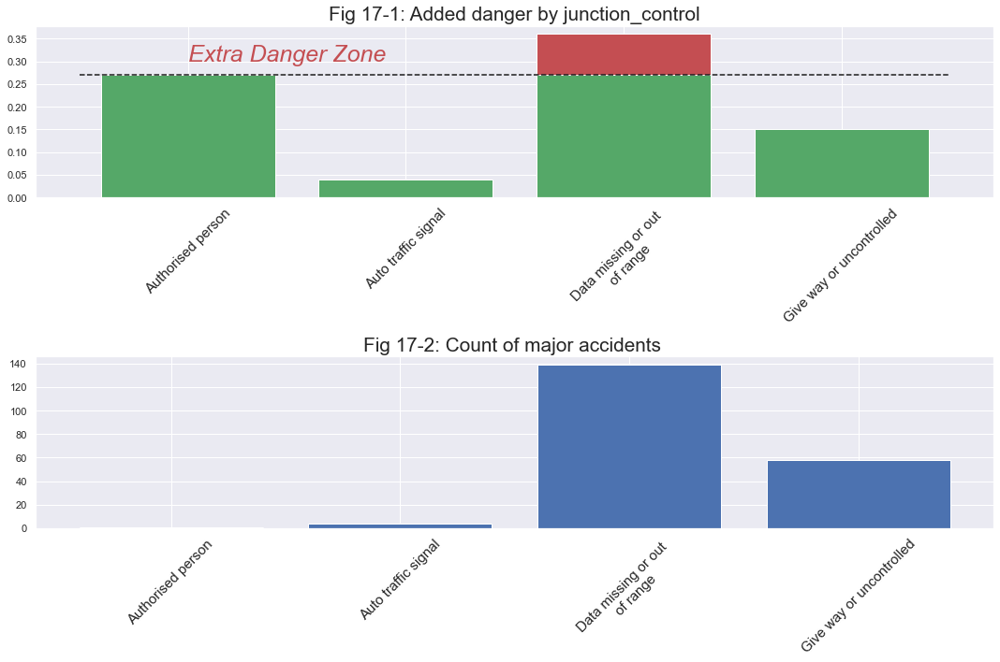

In [86]:
plot_danger_freq("junction_control", "Authorised person", 
                 "junc_control_major_%", "junc_control_count",
                 0, 0.3, "Fig 17-1", "Fig 17-2") 

Fig 17-02 shows that, some level of "control" in the junctions reduces the count of major accidents.

But majority of the data is missing. This makes it hard to conclude. So we must check the reasoning behind the massive missing data ("Data missing or out of range") in future studies. 


#### **PEDESTRIAN CROSSING HUMAN CONTROL**<a id="pchc"></a>

 For road surface conditions, our threshold shall be **"None within 50 meters"** condition.

In [87]:
df_major["ped_cont_major_%"] = df_major["pedestrian_crossing_human_control"].map(major_perc("pedestrian_crossing_human_control"))

In [88]:
df_major["ped_cont_major_count"] = df_major["pedestrian_crossing_human_control"].map(major_count("pedestrian_crossing_human_control"))

array([<AxesSubplot:title={'center':'Fig 18-1: Added danger by pedestrian_crossing_human_control'}>,
       <AxesSubplot:title={'center':'Fig 18-2: Count of major accidents '}>],
      dtype=object)

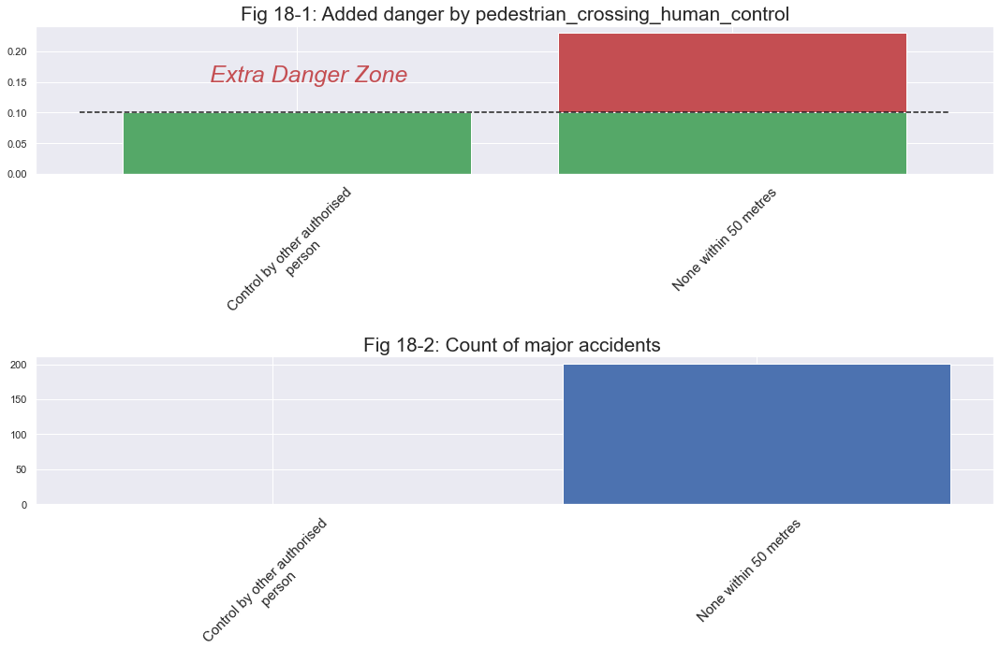

In [89]:
plot_danger_freq("pedestrian_crossing_human_control", "Control by other authorised person", 
                 "ped_cont_major_%", "ped_cont_major_count", -0.2, 0.15, "Fig 18-1", "Fig 18-2") 

As seen in both of the above figures, locations with "less control" are the ones witnessing most of the major accidents. Reason is obvious.

⬇️One more time, we observe that speed limit is the major cause.

In [90]:
df_major.groupby("pedestrian_crossing_human_control")[["speed_limit"]].median().sort_values(by="speed_limit", ascending=False)

,speed_limit
pedestrian_crossing_human_control,
None within 50 metres,60
Control by other authorised person,40


#### **PEDESTRIAN CROSSING PHYSICAL FACILITIES**<a id="pcpf"></a> 

 There is no logical threshold for pedestrian crossing physical facilities

In [91]:
df_major["ped_cont_pf_major_%"] = df_major["pedestrian_crossing_physical_facilities"].map(major_perc("pedestrian_crossing_physical_facilities"))

In [92]:
df_major["ped_cont_pf_major_count"] = df_major["pedestrian_crossing_physical_facilities"].map(major_count("pedestrian_crossing_physical_facilities"))

Text(3.5, 0.3, 'NO')

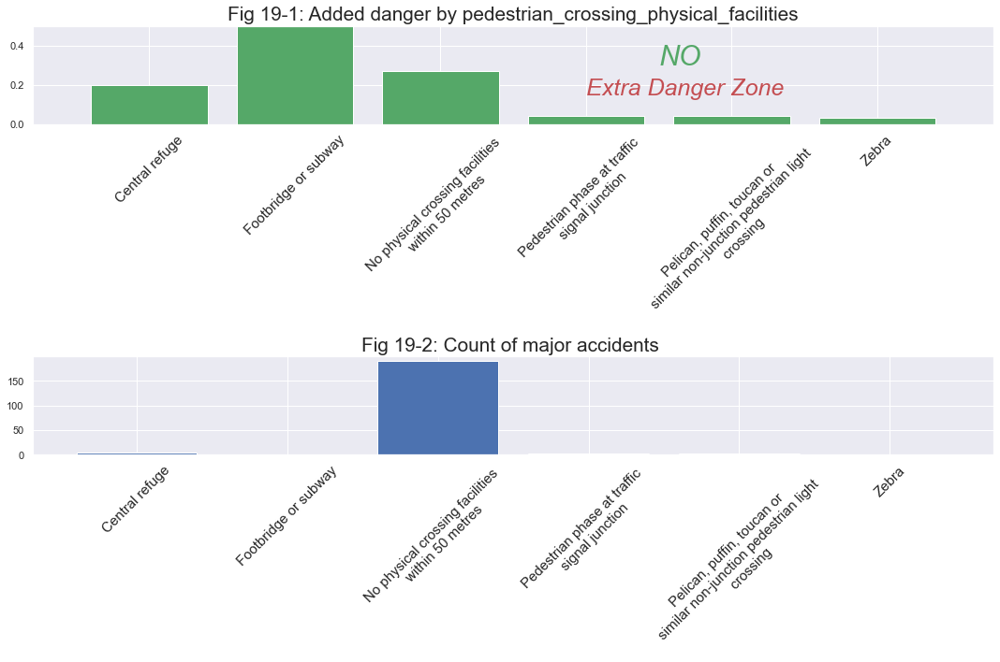

In [93]:
ax = plot_danger_freq("pedestrian_crossing_physical_facilities", "Footbridge or subway", 
                 "ped_cont_pf_major_%", "ped_cont_pf_major_count", 3, 0.15, "Fig 19-1", "Fig 19-2") 
ax[0].text(3.5,0.3, s="NO", fontsize=30, color="g", style="italic")

⬇️It is not surprising that once more we observe that the speed limit is the main cause 

In [94]:
df_major.groupby("pedestrian_crossing_physical_facilities")[["speed_limit"]].median().sort_values(by="speed_limit", ascending=False)

,speed_limit
pedestrian_crossing_physical_facilities,
No physical crossing facilities within 50 metres,60
Footbridge or subway,40
"Pelican, puffin, toucan or similar non-junction pedestrian light crossing",40
Central refuge,30
Pedestrian phase at traffic signal junction,30
Zebra,30


#### **SPECIAL CONDITIONS AT SITE**<a id="special"></a> 

 For road surface conditions, our threshold shall be **"None"** condition.

In [95]:
df_major["special_conditions_major_%"] = df_major["special_conditions_at_site"].map(major_perc("special_conditions_at_site"))

In [96]:
df_major["special_conditions_major_count"] = df_major["special_conditions_at_site"].map(major_count("special_conditions_at_site"))

array([<AxesSubplot:title={'center':'Fig 20-1: Added danger by special_conditions_at_site'}>,
       <AxesSubplot:title={'center':'Fig 20-2: Count of major accidents '}>],
      dtype=object)

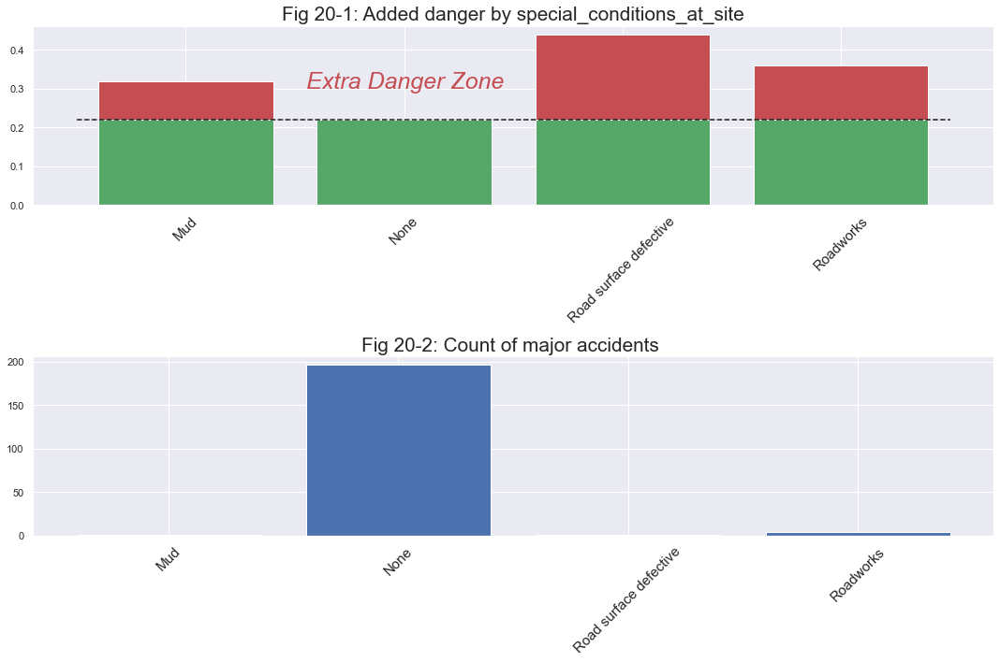

In [97]:
plot_danger_freq("special_conditions_at_site", "None", 
                 "special_conditions_major_%", "special_conditions_major_count", 0.55, 0.3, "Fig 20-1", "Fig 20-2") 
#ax[0].text(3.5,0.3, s="NO", fontsize=30, color="g", style="italic")

Fig 20 shows that there are not too many major incidents on the locations with special conditions, but those rare cases are extremely dangerous.

#### **NUMBER OF VEHICLES**<a id="nov"></a>

Since financial cost of the accidents is the last of our concerns, I intentionally pushed this feature the end. This feature is important for us mainly to infer some patterns.

In [98]:
df_major["nov_major_%"] = df_major["number_of_vehicles"].map(major_perc("number_of_vehicles"))

In [99]:
df_major["nov_major_count"] = df_major["number_of_vehicles"].map(major_count("number_of_vehicles"))

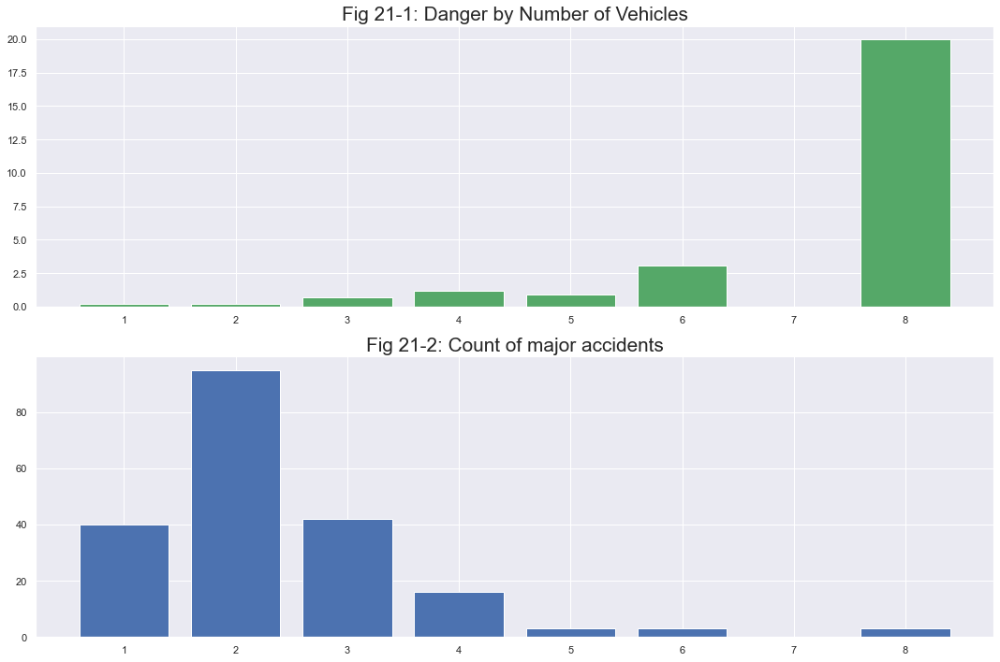

In [100]:
df_gb = df_major.groupby("number_of_vehicles")[["nov_major_%", "nov_major_count"]].mean()
fig, ax = plt.subplots(2,1,figsize=(15,10))
ax[0].bar(df_gb.index , df_gb["nov_major_%"], color="g")
ax[0].set_title("Fig 21-1: Danger by Number of Vehicles", loc="center", size="xx-large")
ax[1].bar(df_gb.index , df_gb["nov_major_count"])
ax[1].set_title("Fig 21-2: Count of major accidents", loc="center", size="xx-large")
plt.tight_layout()

There is an interesting negative correlation between the magnitude of major accidents and danger, but it is hard to infer any further results from this correlation since there is not enough data about the accidents with more than 4 cars involved.


# **3) ANSWERS:**<a id="Answers"></a>

## Question 1)  What time of day and day of the week do most major incidents happen?<a id="Q1"></a>

We have observed that weekends and weekdays have different characteristics about major incidents. Also Urban and Rural locations have different patterns. The answer of the question is simply **"daytime"**, more particularly **"just before the dark"**. 

When it comes to day of week; Saturdays and Fridays are standing out to host the most major accidents in both after work (18:00) and late hours (22:00) (Fig 07 & Fig 06)

## Question 2) Are there any patterns in the time of day/ day of the week when major incidents occur?<a id="Q2"></a>

Yes there are. We have already stated many patterns above, but aside from aforementioned patterns;

* Daytime in Rural areas has a very high count of major incidents compared to "night" and "evening" both in weekends and weekdays. Among many other possible reasons, that may be caused by the amount of travelers that spends their weekends on Rural areas. That may have sth to do with the prohibitions during the Covid-19 pandemic.     

*  "Party", and "From Work" patterns are also visible in major incidents plots. But despite the clear pattern that we have observed from the **all accidents** data, there is no sign of "To Work" accidents in morning, among **major incidents**. "Figure 05-02" gives us the clue about this inconsistency; morning accidents are not as dangerous as the other ones. Probably people do not rush to go "to their work"👷, like they rush to "go to home"🏠 or "go out at night"👯‍   

* There are total;
    * 61.737 accidents took place in **Urban** areas, where only **49** of those are **major incident**. Which is only **%0.08** of all **Urban** accidents and **%32** of all **major accidents**
    * 29.448 accidents took place in **Rural** areas, where **153** of those are **major incident**. Which is **%0.52** of all **Urban** accidents and **%68** of all **major accidents**
    * It is an interesting fact that frequency of major accidents in **Rural** areas are **6.5** times more than the frequency of major accidents in **Urban** areas. We already know that speed limits are higher in rural areas as (as plotted above). Is that the cause? or Is that because of less control? that will be answered in latter questions.

* On **Weekends**, the count of major incidents; 
    + Increases, in **Late night** hours in **Rural** areas ⬆️. No significant change in **Urban** areas.
    + Increases, in **Evening** hours, in **Urban** areas ⬆️. Decreases in **Rural** areas ⬇️   
    + Decreases, in **Daytime** in both **Rural & Urban** areas  ⬇️ 
    
    So this means  a further study shall be conducted to learn the reason behind this trends.
* Number of major incidents significantly increase in;
    * **Winter** both in **Urban** and **Rural** areas, with a significant increase in number of casualties even among major incidents of other seasons.
    * **Summer** in **Rural** areas,
    * **Fall** in **Urban** areas.
    * Reason of this trends is a good subject for a future study.

## Question 3) What characteristics stand out in major incidents compared with other accidents?<a id="Q3"></a>

The most specific character of major incidents is the speed limit of the road that accident happen. This makes complete sense, as the speed will increase the impact of the accident. 

Most of the negative conditions that effect the severity of the accidents can be neutralized by low speed. As stated in above figures and maps, the locations and conditions that major incidents most seen are all in high speed roads where normal accidents are more seen in low speed roads and city centers. 

Below list displays the median and average speed limits on the roads that major incidents happen and the other roads. 

In [101]:
df_label.groupby("Is_Major")[["speed_limit"]].agg(["mean","median"]).round()

speed_limit       
                mean median
Is_Major                   
False           36.0     30
True            51.0     60

Another characteristic of the major incidents is weather conditions, it is observed that major accidents drastically increase in wet or damp roads, flood(over 3cm) and windy weathers. So it was not surprising to observe the increase in major incident counts in winter season. 

Timing of major incidents also have a different characteristics compared to normal accidents. Evening and midnight hours are much more prone to major incidents, which we studied in detail in Question2. 

There are some other characteristics observed in major incidents. Major incidents are more likely to happen in; 
* "T or staggered" type of junctions. Also accidents happened in "Crossroads" are observed to be more prone to be major, compared to "Roundabouts",
* dark roads compared to daylight or well illuminated roads 🔺
* the roads with negative special conditions like mud, defected surface or roadworks 🔨🔨🔨

## Question 4) On what areas would you recommend the planning team focus their brainstorming efforts to reduce major incidents?<a id="Q4"></a>

Reducing the major incidents is possible by neutralizing the negative effects that cause the major incidents. So brainstorming of planning team shall mainly focus on;
   1) Finding appropriate methods to prevent drivers making **high speeds**.
   2) Actively controlling the road conditions and informing drivers swiftly as they occur.
   3) Taking preventive actions to reduce the effects of bad road conditions. For example; a proper inclination towards the side of the roads helps preventing water accumulation on roads.
   4) Implementing precautions to reduce the effect of the **winds** on cars. For example; building wind shields on the direction of prevailing winds on certain roads.
   5) The interesting pattern in **Manchester** about major incidents. Number of major accidents are higher in city, compared with the rest of the map.
   6) We know that the speed limit is the main problem in A(M) roads and Motorways but **M4** and **M8** seems to be more recidivous than the others. If true, there must be a chronical problem with that roads to be solved.
   7) Making **Future Studies** to better observe the patterns and causalities on the following subjects;
       * reason behind the increase in major incidents in; rural areas in summer and urban areas in fall,
       * reasoning behind the massive missing data in "junction_control" feature,
       * relation between number of vehicles and major incidents. They may find an interesting negative correlation with more data,
       * added dangers that are mentioned in [Effects of Other Conditions](#other) section,
       

# 4) CONCLUSION:<a id="Conc"></a> 


Accidents will be happening. There is way to finish them all. 

What we can/must simultaneously do is, trying to;

1) reduce the number of accidents by taking preventive precautions,
2) reduce the bad outcomes of accidents by reducing the speed of the cars.

At the same time roads must be maintained to be more convenient for high speeds, and speed limits must be actively checked by observing the count of major accidents.

Thanks for reading to the end, I hope it was not that boring...

Kindest Regards,

Ahmet KÖKLÜ

ahmetkoklu@hotmail.com

https://www.linkedin.com/in/ahmet-koklu-2475a710/

https://github.com/ahmetkoklu
